In [8]:
using AstroLib, Measurements, Cosmology

In [9]:
mag2flux(12.54 ± 0.03)

3.499e-14 ± 9.7e-16

In [10]:
using Unitful, UnitfulAstro, Cosmology

In [11]:
Cosmology.cosmology(OmegaM=0.3)

Cosmology.FlatLCDM{Float64}(0.69, 0.6999122024007928, 0.3, 8.77975992071536e-5)

In [12]:
c = cosmology(OmegaM=0.26)

Cosmology.FlatLCDM{Float64}(0.69, 0.7399122024007928, 0.26, 8.77975992071536e-5)

In [13]:
julian_date = jdcnv(2023, 1, 1)
println("The Julian date for January 1, 2023, is: $julian_date")

The Julian date for January 1, 2023, is: 2.4599455e6


In [14]:
angular_diameter_dist(c, 1.2), luminosity_dist(c, 1.5)

(1784.0089227105113 Mpc, 11420.338287150073 Mpc)

In [19]:
min.([0,1, 2, 3, 4], 1)

5-element Vector{Int64}:
 0
 1
 1
 1
 1

In [34]:
function testreal(i::Real)
    sum::Real = 0.
    for j in Vector(range(1,i,i))
        sum = sum + j
    end
    return sum
end

function testfloat(i::Float64)
    sum::Float64 = 0.
    for j in Vector(range(1,Int(i),Int(i)))
        sum = sum + j
    end
    return sum
end

function testno(i)
    sum = 0.
    for j in Vector(range(1,Int(i),Int(i)))
        sum = sum + j
    end
    return sum
end

testno (generic function with 1 method)

In [35]:
testreal(10)

55.0

In [36]:
@time testreal(10000)

  0.000021 seconds (2 allocations: 78.172 KiB)


5.0005e7

In [37]:
@time testfloat(10000.)

  0.000020 seconds (2 allocations: 78.172 KiB)


5.0005e7

In [38]:
@time testno(10000.)

  0.000030 seconds (2 allocations: 78.172 KiB)


5.0005e7

In [20]:
angular_diameter_dist(u"Gpc", c, 1.2)

1.7840089227105114 Gpc

In [21]:
error("err test")

ErrorException: err test

In [22]:
sqrt.([1, 2, 4])

3-element Vector{Float64}:
 1.0
 1.4142135623730951
 2.0

In [23]:
atan.([1, 2, 3]) ./ pi

3-element Vector{Float64}:
 0.25
 0.35241638234956674
 0.39758361765043326

# Plots Test

In [25]:
using Plots, PyPlot

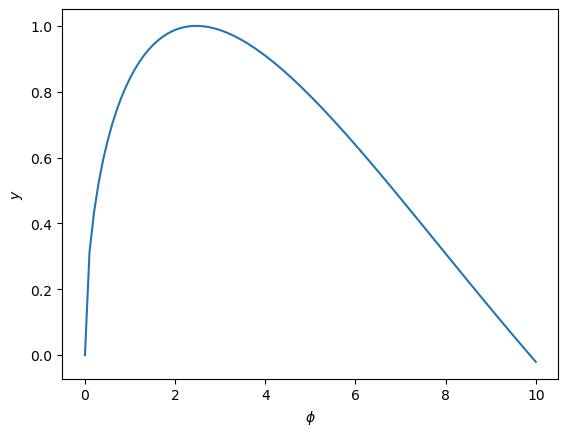

In [26]:
x = range(0, 10, length=100)
y = sin.(sqrt.(x))
fig1 = figure(1)
PyPlot.plot(x, y)
PyPlot.xlabel(L"$ϕ$")
PyPlot.ylabel(L"y")
gcf()

In [27]:
PyPlot.clf()

sys:1: UserWarning: The following kwargs were not used by contour: 'color'


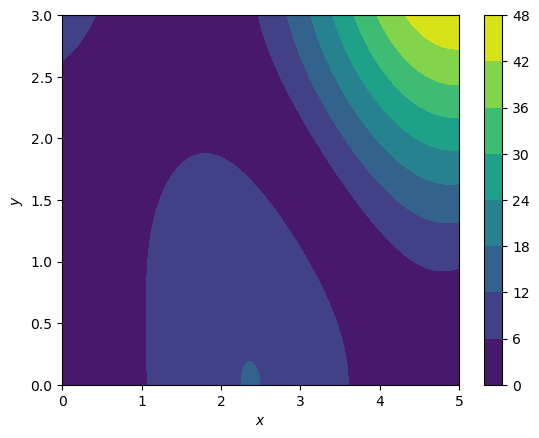

In [28]:
fig = figure(2)

f(x, y) = (3x + y^2) * abs(sin(x) + cos(y))

x = range(0, 5, length=100)
y = range(0, 3, length=50)
z = @. f(x', y)
PyPlot.contourf(x, y, z, color=:turbo)
PyPlot.xlabel(L"x")
PyPlot.ylabel(L"y")
PyPlot.colorbar()
gcf()

In [29]:
PyPlot.clf()

In [30]:
using Plots;
gr();

In [31]:
M = [1 2; 3 4]

2×2 Matrix{Int64}:
 1  2
 3  4

In [27]:
using LinearAlgebra

In [28]:
inv(M)

2×2 Matrix{Float64}:
 -2.0   1.0
  1.5  -0.5

In [29]:
inv(M + 1e-10 * I)

2×2 Matrix{Float64}:
 -2.0   1.0
  1.5  -0.5

# SIS Model Test

In [32]:
using LazyGrids, PyPlot

In [37]:
x = range(-2, 2, 101)
(xg, yg) = ndgrid(x, x)

([-2.0 -2.0 … -2.0 -2.0; -1.96 -1.96 … -1.96 -1.96; … ; 1.96 1.96 … 1.96 1.96; 2.0 2.0 … 2.0 2.0], [-2.0 -1.96 … 1.96 2.0; -2.0 -1.96 … 1.96 2.0; … ; -2.0 -1.96 … 1.96 2.0; -2.0 -1.96 … 1.96 2.0])

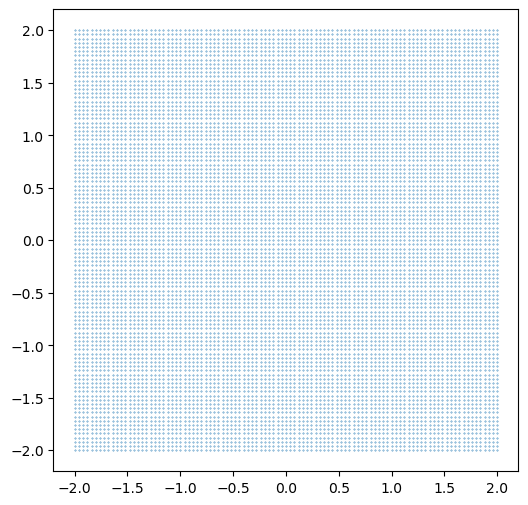

In [38]:
figg = PyPlot.figure(figsize=(6, 6))
PyPlot.scatter(xg, yg, s=0.1)
gcf()

In [39]:
PyPlot.clf()

In [20]:
#= 
SIS model: κ = \frac{1}{2} \frac{θ_E}{ x^2 + y^2 }

I set θ_E = 1.0 in this example 
=#
function SIS(x, y, s=0.1, theta_E=1.5, xc=0.0, yc=0.0)
    xs = x .- xc
    ys = y .- yc
    fermat = theta_E .* sqrt.(s .^ 2 .+ xs .^ 2 .+ ys .^ 2)
    return fermat
end

function SIS_d(x, y, s=0.1, theta_E=1.5, xc=0.0, yc=0.0)

    xs = x .- xc
    ys = y .- yc
    R = sqrt.(s .^ 2 .+ xs .^ 2 .+ ys .^ 2)

    if typeof(R) .== Int64 || typeof(R) .== Float64
        a = theta_E ./ max.(0.000001, R)
    else
        a = zeros(size(R))
        r = R[R.>0.0]  # in the SIS regime
        a[R.==0.0] .= 0
        a[R.>0.0] .= theta_E ./ r
    end
    f_x = a .* xs
    f_y = a .* ys

    return f_x, f_y
end

function SIS_h(xg, yg, theta_E=1.5, xcentre=0.0, ycentre=0.0)

    xsh = xg - xcentre
    ysh = yg - ycentre

    R .= sqrt.(xsh .^ 2 .+ ysh .^ 2) .^ (3.0 / 2)
    h = zeros(size(R))
    r = R[R.>0.0]  # in the SIS regime
    h[R.==0.0] .= 0
    h[R.>0.0] .= theta_E ./ r

    f_xx = ysh .* ysh .* h
    f_yy = xsh .* xsh .* h
    f_xy = -xsh .* ysh .* h
    return f_xx, f_xy, f_yy

end

function SIE_d(x, y, theta_E=1.0, s=0.1, q=0.95, xc=0.0, yc=0.0, phi=pi / 4)

    xs = x .- xc
    ys = y .- yc

    xs, ys = LensRotation(xs, ys, -phi)

    R = sqrt.(s .^ 2 .+ xs .^ 2 .* q .+ ys .^ 2 ./ q)

    if typeof(R) .== Int64 || typeof(R) .== Float64
        a = theta_E ./ max.(0.000001, R)
    else
        a = zeros(size(R))
        r = R[R.>0.0]  # in the SIE regime
        a[R.==0.0] .= 0
        a[R.>0.0] .= theta_E ./ r
    end
    f_x = a .* xs .* q
    f_y = a .* ys ./ q

    f_x, f_y = LensRotation(f_x, f_y, phi)

    return f_x, f_y
end

SIE_d (generic function with 7 methods)

In [21]:
SIS_d(1, 0.5)

(1.3363062095621219, 0.6681531047810609)

In [22]:
Fermat = SIS(xg, yg);

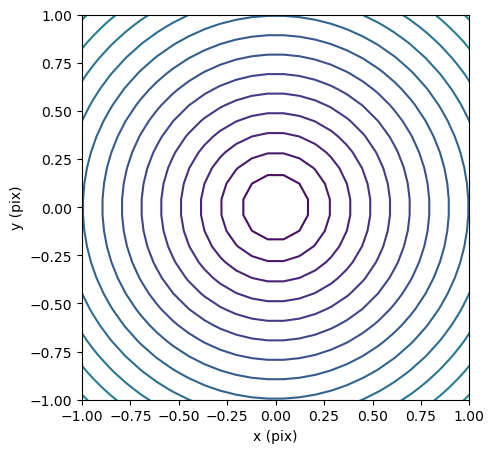

In [25]:
PyPlot.contourf(xg, yg, Fermat, 30)
PyPlot.xlim(-1, 1)
PyPlot.ylim(-1, 1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
gcf()

In [26]:
PyPlot.clf()

In [383]:
f_x, f_y = SIS_d(xg, yg) # deflection angles f_i
xb, yb = xg .- f_x, yg .- f_y  # lensed image plane

([-0.9400021199936401 -0.9378784141627301 … -0.9378784141627301 -0.9400021199936401; -0.934119382442639 -0.9319914239287905 … -0.9319914239287905 -0.934119382442639; … ; 0.934119382442639 0.9319914239287905 … 0.9319914239287905 0.934119382442639; 0.9400021199936401 0.9378784141627301 … 0.9378784141627301 0.9400021199936401], [-0.9400021199936401 -0.934119382442639 … 0.934119382442639 0.9400021199936401; -0.9378784141627301 -0.9319914239287905 … 0.9319914239287905 0.9378784141627301; … ; -0.9378784141627301 -0.9319914239287905 … 0.9319914239287905 0.9378784141627301; -0.9400021199936401 -0.934119382442639 … 0.934119382442639 0.9400021199936401])

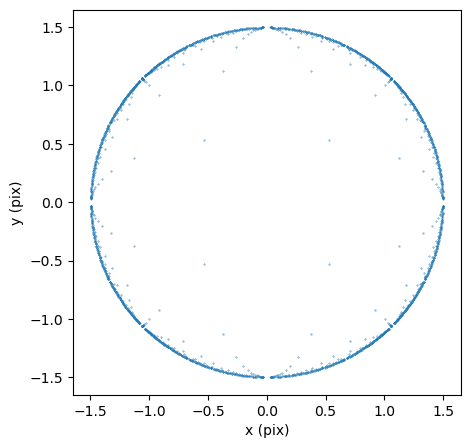

In [28]:
PyPlot.scatter(f_x, f_y, s=0.1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
gcf()

In [29]:
function Pol2Car(r, phi, xc=0.0, yc=0.0)

    x = r .* cos.(phi)
    y = r .* sin.(phi)

    return x .+ xc, y .+ yc

end

Pol2Car (generic function with 3 methods)

In [30]:
r = range(0.49, 0.51, 11)
theta = range(0.0, 2 * pi, 501)
rg, thetag = ndgrid(r, theta)

([0.49 0.49 … 0.49 0.49; 0.492 0.492 … 0.492 0.492; … ; 0.508 0.508 … 0.508 0.508; 0.51 0.51 … 0.51 0.51], [0.0 0.012566370614359173 … 6.270618936565227 6.283185307179586; 0.0 0.012566370614359173 … 6.270618936565227 6.283185307179586; … ; 0.0 0.012566370614359173 … 6.270618936565227 6.283185307179586; 0.0 0.012566370614359173 … 6.270618936565227 6.283185307179586])

In [31]:
xc, yc = Pol2Car(rg, thetag, 0.0, 0.0)

([0.49 0.4899613116598699 … 0.4899613116598699 0.49; 0.492 0.49196115374827754 … 0.49196115374827754 0.492; … ; 0.508 0.5079598904555386 … 0.5079598904555386 0.508; 0.51 0.5099597325439462 … 0.5099597325439462 0.51], [0.0 0.006157359542842778 … -0.00615735954284295 -1.2001538631644062e-16; 0.0 0.006182491622609483 … -0.006182491622609656 -1.2050524503609956e-16; … ; 0.0 0.006383548260743124 … -0.006383548260743304 -1.2442411479337108e-16; 0.0 0.0064086803405098295 … -0.00640868034051001 -1.2491397351303002e-16])

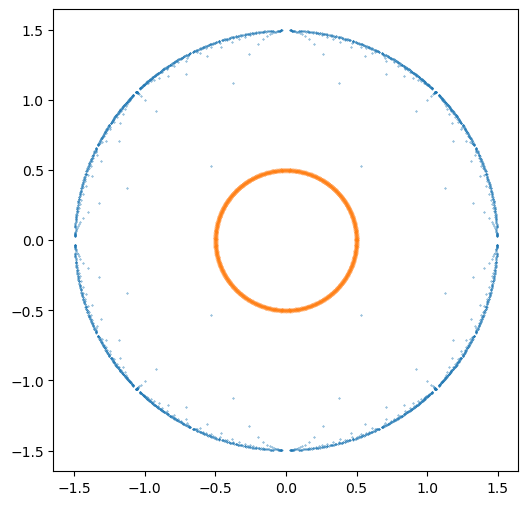

In [201]:
PyPlot.scatter(xc, yc, s=0.01)
gcf()

In [202]:
PyPlot.clf()

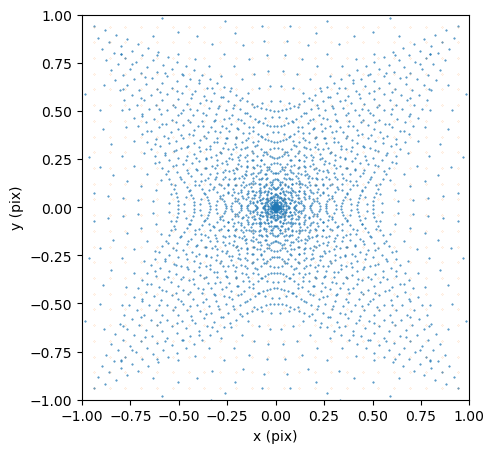

In [35]:
PyPlot.figure(figsize=(5, 5))
PyPlot.scatter(xb, yb, s=0.2)
PyPlot.scatter(xg, yg, s=0.01)
PyPlot.xlim(-1, 1)
PyPlot.ylim(-1, 1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
gcf()

In [1]:
PyPlot.clf()

UndefVarError: UndefVarError: `PyPlot` not defined

# NIE test

In [31]:
push!(LOAD_PATH, "LensModels/")

4-element Vector{String}:
 "@"
 "@v#.#"
 "@stdlib"
 "LensModels/"

In [32]:
using LazyGrids, PyPlot
include("LensModels/NIE.jl")

Main.NIE

In [33]:
include("LensUtils.jl")

Main.LensUtils

In [34]:
NIE.LensDerivative

LensDerivative (generic function with 1 method)

In [58]:
r = range(0, 2, 4000)
theta = range(0, 2 * pi, 4000)
x = range(-2, 2, 50)
(rg, thetag) = ndgrid(r, theta);

In [59]:
function Pol2Car(r, phi, xc=0.0, yc=0.0)

    x = @. r .* cos.(phi)
    y = @. r .* sin.(phi)

    return x .- xc, y .- yc

end

Pol2Car (generic function with 3 methods)

In [60]:
(xpg, ypg) = Pol2Car(rg, thetag)
(xg, yg) = ndgrid(x, x)

([-2.0 -2.0 … -2.0 -2.0; -1.9183673469387754 -1.9183673469387754 … -1.9183673469387754 -1.9183673469387754; … ; 1.9183673469387754 1.9183673469387754 … 1.9183673469387754 1.9183673469387754; 2.0 2.0 … 2.0 2.0], [-2.0 -1.9183673469387754 … 1.9183673469387754 2.0; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0; … ; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0])

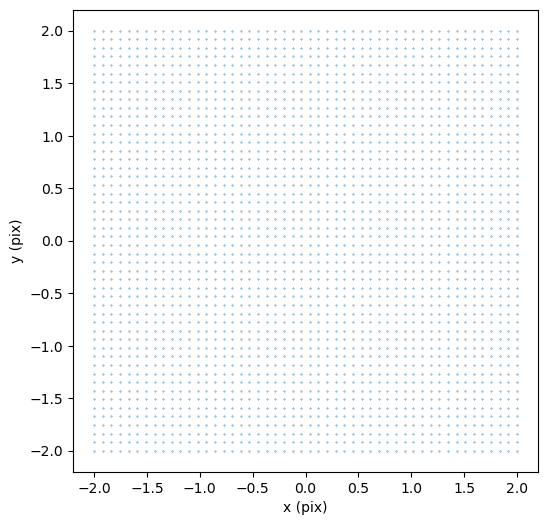

In [61]:
figg = PyPlot.figure(figsize=(6, 6))
PyPlot.scatter(xg, yg, s=0.1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("grid.pdf")
gcf()

In [62]:
PyPlot.clf()

In [63]:

function LensRotation(xg, yg, varphi)

    xr = cos(varphi) .* xg .- sin(varphi) .* yg

    yr = sin(varphi) .* xg .+ cos(varphi) .* yg

    return xr, yr

end

function NIE_F(xg, yg, b=1.5, s=0.1, q=0.8, varphi=pi / 6, xcentre=0.0, ycentre=0.0)

    xsh = xg .- xcentre
    ysh = yg .- ycentre

    xsh, ysh = LensRotation(xsh, ysh, -varphi)

    psi = sqrt.(q .^ 2 .* (s .^ 2 .+ xsh .^ 2) .+ ysh .^ 2)

    q = min.(q, 0.9999)

    f_x, f_y = NIE_D(xsh, ysh, b, s, q, 0.0, 0.0, 0.0)

    f = xsh .* f_x .+ ysh .* f_y .- b .* s .* 1.0 ./ 2.0 .* log.((psi .+ s) .^ 2 .+ (1.0 .- q .^ 2) .* xsh .^ 2)

    return f

end

function NIE_D(xg, yg, b=1.5, s=0.1, q=0.8, varphi=pi / 6, xcentre=0.0, ycentre=0.0)

    """Returns df/dx and df/dy of the function."""
    xsh = xg .- xcentre
    ysh = yg .- ycentre

    xsh, ysh = LensRotation(xsh, ysh, -varphi)

    psi = sqrt.(q .^ 2 .* (s .^ 2 .+ xsh .^ 2) .+ ysh .^ 2)

    q = min.(q, 0.9999)

    psi = sqrt.(q .^ 2 .* (s .^ 2 .+ xsh .^ 2) .+ ysh .^ 2)

    f_x = b ./ sqrt.(1.0 .- q .^ 2) .* atan.(sqrt.(1.0 .- q .^ 2) .* xsh ./ (psi .+ s))

    f_y = b ./ sqrt.(1.0 .- q .^ 2) .* atanh.(sqrt.(1.0 .- q .^ 2) .* ysh ./ (psi .+ q .^ 2 .* s))

    f_x, f_y = LensRotation(f_x, f_y, varphi)
    return f_x, f_y

end

function NIE_H(xg, yg, b=1.5, s=0.1, q=0.8, varphi=pi / 6, xcentre=0.0, ycentre=0.0, diff=1e-9)

    # shift
    xsh = @. xg - xcentre
    ysh = @. yg - ycentre
    # rotate
    xsh, ysh = LensRotation(xsh, ysh, -varphi)

    # hessian in major axis
    f_x, f_y = NIE_D(xsh, ysh, b, s, q, 0.0, 0.0, 0.0)
    f_x_dx, _ = NIE_D(xsh .+ diff, ysh, b, s, q, 0.0, 0.0, 0.0)
    f_x_dy, f_y_dy = NIE_D(xsh, ysh .+ diff, b, s, q, 0.0, 0.0, 0.0)

    f_xx = (f_x_dx .- f_x) ./ diff
    f_xy = (f_x_dy .- f_x) ./ diff
    f_yy = (f_y_dy .- f_y) ./ diff

    # rotate back
    kappa = @. 1.0 / 2.0 * (f_xx + f_yy)
    gamma1_ = @. 1.0 / 2.0 * (f_xx - f_yy)
    gamma2_ = f_xy
    gamma1 = @. cos(2.0 * varphi) * gamma1_ + sin(2.0 * varphi) * gamma2_
    gamma2 = @. -sin(2.0 * varphi) * gamma1_ + cos(2.0 * varphi) * gamma2_
    f_xx = @. kappa + gamma1
    f_yy = @. kappa - gamma1
    f_xy = gamma2

    return f_xx, f_xy, f_yy

end

NIE_H (generic function with 8 methods)

In [64]:
xt = range(0.1, 0.5, 101)

0.1:0.004:0.5

In [65]:
xtd, _ = NIE.LensDerivative(xt, ; b=1.5)
delta = 1e-4
xtf = (NIE.LensMass(xt .+ delta, 0.0; b=1.5) .- NIE.LensMass(xt, 0.0; b=1.5)) ./ delta;

MethodError: MethodError: no method matching LensDerivative(::StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}; b::Float64)

Closest candidates are:
  LensDerivative(!Matched::Union{LazyGrids.GridSL, Matrix{Float64}}, !Matched::Union{LazyGrids.GridSL, Matrix{Float64}}; b, s, q, varphi, xcentre, ycentre)
   @ Main.NIE ~/Documents/VScodeProjects/Jens/LensModels/NIE.jl:42


In [66]:
PyPlot.plot(xt, xtd, c="b")
PyPlot.plot(xt, xtf, c="orange", "--")
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("Derivative of function (pix)")
PyPlot.legend(["df/dx", "(f(x+d)-f(x))/d"])
#PyPlot.savefig("derivative.pdf")
gcf()

UndefVarError: UndefVarError: `xtd` not defined

In [46]:
PyPlot.clf()

In [67]:
f_x, f_y = NIE.LensDerivative(xg, yg) # deflection angles f_i
xb, yb = xg .- f_x, yg .- f_y  # lensed image plane

([-0.9396233184386276 -0.9142919138045882 … -0.8378532385144157 -0.8584888675240596; -0.8852884265689445 -0.8595328628841852 … -0.7783908032034721 -0.7993861451923885; … ; 0.7993861451923885 0.7783908032034721 … 0.8595328628841852 0.8852884265689445; 0.8584888675240596 0.8378532385144157 … 0.9142919138045882 0.9396233184386276], [-0.846622473047455 -0.7923766082867791 … 0.7165886595698332 0.7756384137076304; -0.8213660116953345 -0.7665440044850382 … 0.6955501249093989 0.7550448033880204; … ; -0.7550448033880204 -0.6955501249093989 … 0.7665440044850382 0.8213660116953345; -0.7756384137076304 -0.7165886595698332 … 0.7923766082867791 0.846622473047455])

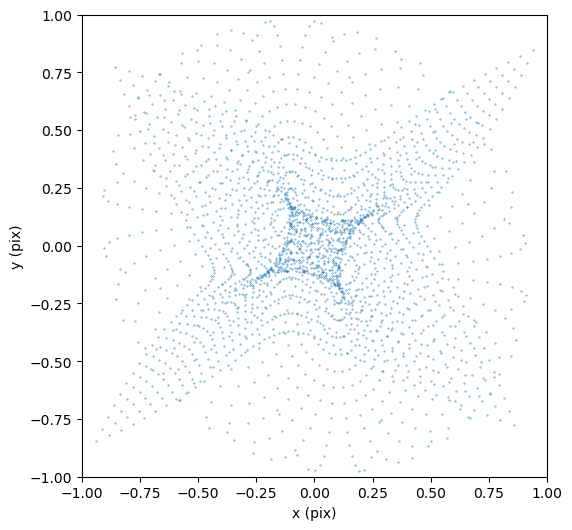

In [68]:
figd = PyPlot.figure(figsize=(6, 6))
PyPlot.scatter(xb, yb, s=0.1)
#PyPlot.scatter(xg, yg, s=0.1)
PyPlot.xlim(-1, 1)
PyPlot.ylim(-1, 1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("source grid.pdf")
gcf()

In [52]:
PyPlot.clf()

In [69]:
f = NIE.LensMass(xg, yg);

ErrorException: invalid redefinition of constant Main.f

In [50]:
PyPlot.contourf(xg, yg, f)
#PyPlot.colorbar()
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("mass.pdf")
gcf()

PyCall.PyError: PyError ($(Expr(:escape, :(ccall(#= /Users/cyan/.julia/packages/PyCall/1gn3u/src/pyfncall.jl:43 =# @pysym(:PyObject_Call), PyPtr, (PyPtr, PyPtr, PyPtr), o, pyargsptr, kw))))) <class 'TypeError'>
TypeError('Input z must be 2D, not 0D')
  File "/Users/cyan/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/pyplot.py", line 2938, in contourf
    __ret = gca().contourf(
  File "/Users/cyan/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/__init__.py", line 1465, in inner
    return func(ax, *map(sanitize_sequence, args), **kwargs)
  File "/Users/cyan/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/axes/_axes.py", line 6528, in contourf
    contours = mcontour.QuadContourSet(self, *args, **kwargs)
  File "/Users/cyan/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/contour.py", line 847, in __init__
    kwargs = self._process_args(*args, **kwargs)
  File "/Users/cyan/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/contour.py", line 1533, in _process_args
    x, y, z = self._contour_args(args, kwargs)
  File "/Users/cyan/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/contour.py", line 1573, in _contour_args
    x, y, z = self._check_xyz(x, y, z_orig, kwargs)
  File "/Users/cyan/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/contour.py", line 1599, in _check_xyz
    raise TypeError(f"Input z must be 2D, not {z.ndim}D")


In [63]:
PyPlot.clf()

In [64]:
beta = [0.0, 0.0]
F = @. 0.5 * ((beta[1] - xg)^2 + (beta[2] - yg)^2) - f;

In [48]:
figF = PyPlot.figure(figsize=(6, 6))
PyPlot.contour(xg, yg, F, 50)
PyPlot.xlim(-2, 2)
PyPlot.ylim(-2, 2)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("fermat.pdf")
PyPlot.ion()
gcf()

UndefVarError: UndefVarError: `F` not defined

In [148]:
PyPlot.clf()

In [123]:
h_xx, h_xy, h_yy = NIE.LensHessian(xg, yg)

([0.32511518893963065 0.31964862205139694 … 0.26367666251697 0.26825528495143075; 0.34383054403549357 0.3389280244009161 … 0.2796553070074144 0.28387622013565256; … ; 0.2838778755063861 0.2796565560083171 … 0.3389284208069436 0.34383163433091146; 0.26825493302483383 0.26367570103562676 … 0.31965082256983945 0.3251186583865826], [-0.3069838328442747 -0.31355950264181603 … 0.25531443275600296 0.2502097318692689; -0.3116981638377307 -0.31924624291919307 … 0.26007166073841653 0.25427193440978896; … ; 0.2542692159652545 0.26007238184942394 … -0.3192485549938967 -0.3117016777641133; 0.25020897357284116 0.2553149878675153 … -0.31356109360551226 -0.30698215025192416], [0.3252567895548599 0.3459256403192859 … 0.28509103543290015 0.2683682384435771; 0.3180022667422025 0.33908628696069165 … 0.2797838546551527 0.26278927051708983; … ; 0.2627915009269425 0.27978427098878694 … 0.3390842252201272 0.31800228666980923; 0.2683674801471494 0.28509199691424336 … 0.345924550023868 0.3252583161115188])

In [124]:
h = @. (1 - h_xx) * (1 - h_yy) - h_xy^2;

sys:1: UserWarning: The following kwargs were not used by contour: 'clabels'


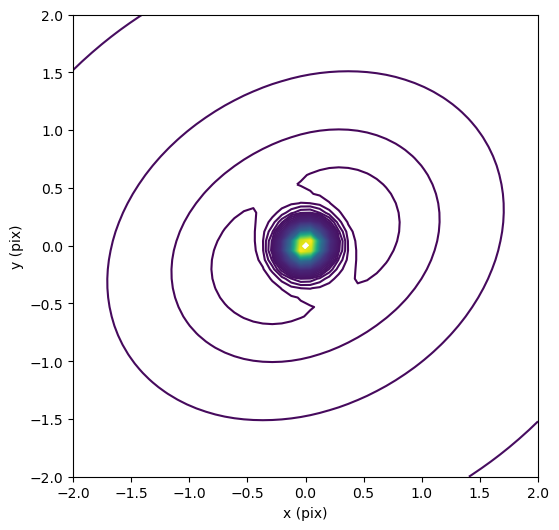

In [149]:
figh = PyPlot.figure(figsize=(6, 6))
PyPlot.contour(xg, yg, (h), 150, clabels=true)
#PyPlot.colorbar()
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("hessian.pdf")
gcf()

In [150]:
PyPlot.clf()

In [131]:
fp_x, fp_y = NIE.LensDerivative(xpg, ypg) # deflection angles f_i
xpb, ypb = xpg .- fp_x, ypg .- fp_y  # lensed image plane

hp_xx, hp_xy, hp_yy = NIE.LensHessian(xpg, ypg)
hp = @. (1 - hp_xx) * (1 - hp_yy) - hp_xy^2;

In [132]:
ccindex = findall(0.0 .< hp .< 0.01);

In [128]:
xpg[ccindex];

In [184]:
ccx = []
ccy = []
csx = []
csy = []

ccx = [xpg[i] for i in ccindex]
ccy = [ypg[i] for i in ccindex]
csx = [xpb[i] for i in ccindex]
csy = [xpb[i] for i in ccindex]

#=
for i in ccindex
    push!(ccx, xpg[i])
    push!(ccy, ypg[i])
    push!(csx, xpb[i])
    push!(csy, ypb[i])
end
=#

#=----------------------#
ccx = [xpg[ccindex...] for i in ccindex]
ccy = [ypg[ccindex...] for i in ccindex]
csx = xpb[ccindex];
csy = xpb[ccindex];
=#


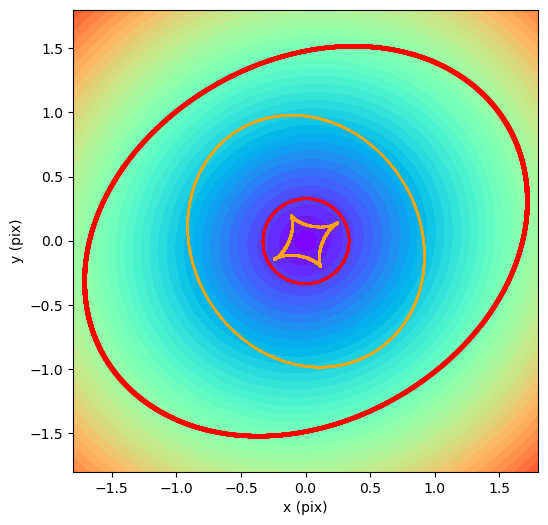

In [185]:
figcc = PyPlot.figure(figsize=(6, 6))
PyPlot.contourf(xg, yg, f, 50, cmap="rainbow")
PyPlot.scatter(ccx, ccy, s=0.1, c="red")
PyPlot.scatter(csx, csy, s=0.1, c="orange")
PyPlot.xlim(-1.8, 1.8)
PyPlot.ylim(-1.8, 1.8)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("caustic.pdf")
gcf()

In [186]:
PyPlot.clf()

# Transportation & Rotation test

In [241]:
PyPlot.clf()

In [242]:
using LazyGrids, Rotations, Meshes

In [243]:
x = range(-3, 3, 51)
(xg, yg) = ndgrid(x, x)

([-3.0 -3.0 … -3.0 -3.0; -2.88 -2.88 … -2.88 -2.88; … ; 2.88 2.88 … 2.88 2.88; 3.0 3.0 … 3.0 3.0], [-3.0 -2.88 … 2.88 3.0; -3.0 -2.88 … 2.88 3.0; … ; -3.0 -2.88 … 2.88 3.0; -3.0 -2.88 … 2.88 3.0])

In [116]:
typeof(xg)

LazyGrids.GridSL{Float64, 1, 2, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}

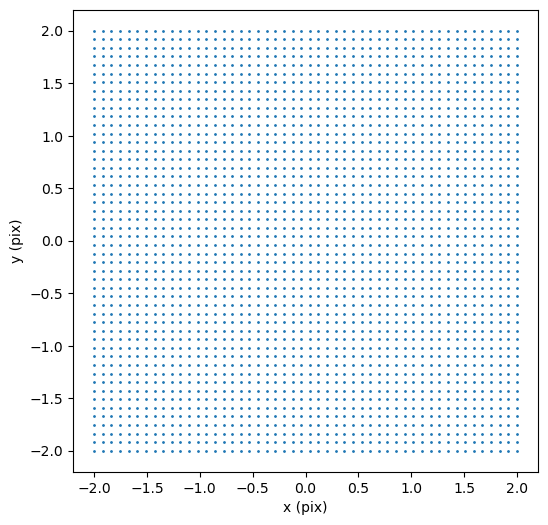

In [157]:
figRot = PyPlot.figure(figsize=(6, 6))
PyPlot.scatter(xg, yg, s=1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
PyPlot.gcf()

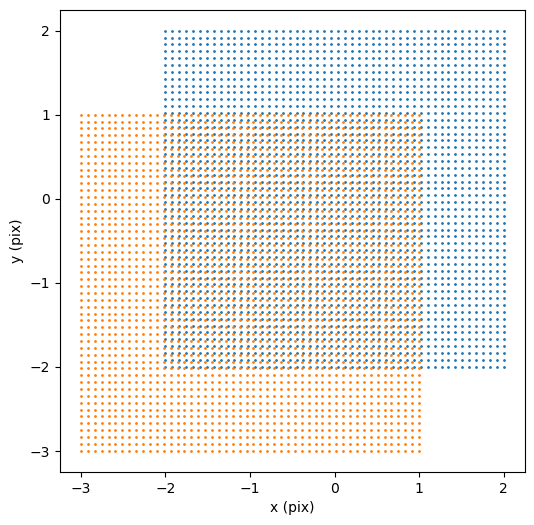

In [158]:
PyPlot.scatter(xg .- 1.0, yg .- 1.0, s=1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
PyPlot.gcf()

In [159]:
function LensRotation(xg, yg, varphi)

    xr = cos(varphi) .* xg .- sin(varphi) .* yg

    yr = sin(varphi) .* xg .+ cos(varphi) .* yg

    return xr, yr

end

LensRotation (generic function with 1 method)

In [160]:
xr, yr = LensRotation(xg, yg, pi / 4)

([-2.220446049250313e-16 -0.05772300254584084 … -2.7707041222003497 -2.82842712474619; 0.057723002545840396 -2.220446049250313e-16 … -2.7129811196545086 -2.7707041222003497; … ; 2.7707041222003497 2.7129811196545086 … 2.220446049250313e-16 -0.057723002545840396; 2.82842712474619 2.7707041222003497 … 0.05772300254584084 2.220446049250313e-16], [-2.82842712474619 -2.7707041222003497 … -0.057723002545840396 2.220446049250313e-16; -2.7707041222003497 -2.7129811196545086 … 2.220446049250313e-16 0.05772300254584084; … ; -0.05772300254584084 -2.220446049250313e-16 … 2.7129811196545086 2.7707041222003497; -2.220446049250313e-16 0.057723002545840396 … 2.7707041222003497 2.82842712474619])

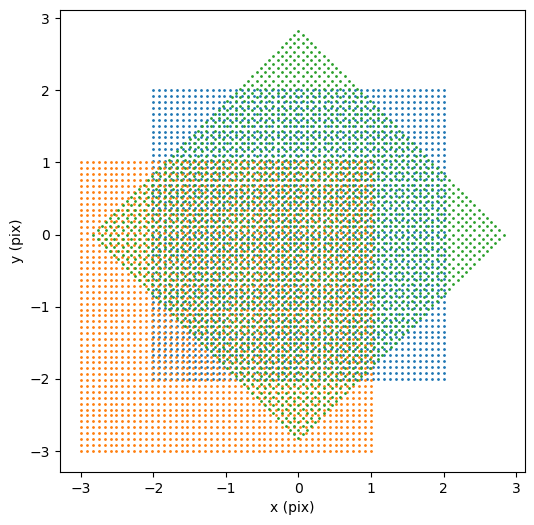

In [161]:
PyPlot.scatter(xr, yr, s=1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("grid trans.pdf")
PyPlot.gcf()

# Derivative Test

## direct function
## symbolic packages
## FFT derivative

In [13]:
using CalculusWithJulia
# PySym, SciML, Symbolics
# FFTW

In [14]:
function SIS(x, y, theta_E=1.0)
    fermat = theta_E .* sqrt(x .* x + y .* y)
    return fermat
end

SIS (generic function with 2 methods)

In [184]:
SIS_d(1, 1)

(1.0580184237878976, 1.0580184237878976)

# FITS I/O

In [317]:
using FITSIO, AstroLib, CFITSIO

In [318]:
Path = "HE0435−1223.fits"

"HE0435−1223.fits"

In [319]:
hdus = FITS(Path)

File: HE0435−1223.fits
Mode: "r" (read-only)
HDUs: Num  Name  Ver  Type   
      1               Image  
      2    SCI   1    Image  

In [322]:
split(Path, ".")[end]

"fits"

In [325]:
Path * "asa"

"HE0435−1223.fitsasa"

# Solver

In [166]:
using NLsolve, HomotopyContinuation

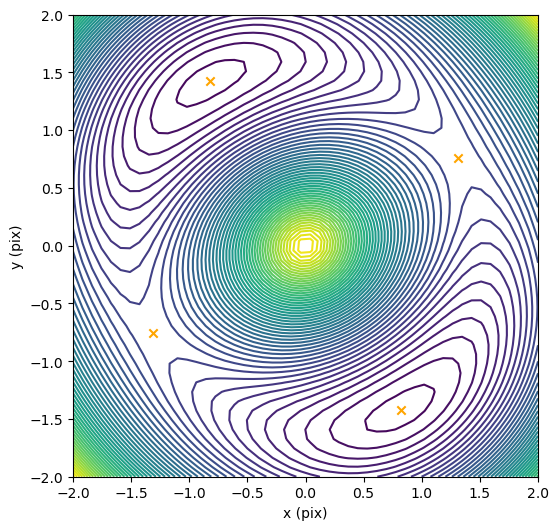

In [171]:
figF = PyPlot.figure(figsize=(6, 6))
PyPlot.contour(xg, yg, F, 50)
PyPlot.scatter([1.3096317184626196, 0.822190810442915, -1.3096317184626196, -0.822190810442915],
    [0.7561162251936575, -1.424076257203303, -0.7561162251936575, 1.424076257203303], marker="x", c="orange")
PyPlot.xlim(-2, 2)
PyPlot.ylim(-2, 2)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
PyPlot.savefig("image position.pdf")
gcf()

In [172]:
PyPlot.clf()

In [73]:
function t!(F, x)
    F[1] = @. x[1]^2 + sin(x[2]) - log(x[1] + 2)
    F[2] = @. x[2] + cos(x[1]) - log(x[2] + 2)
end
nlsolve(t!, [0.0; 1.0])

Results of Nonlinear Solver Algorithm
 * Algorithm: Trust-region with dogleg and autoscaling
 * Starting Point: [0.0, 1.0]
 * Zero: [-0.67756177573137, -0.18059282350709713]
 * Inf-norm of residuals: 0.000000
 * Iterations: 6
 * Convergence: true
   * |x - x'| < 0.0e+00: false
   * |f(x)| < 1.0e-08: true
 * Function Calls (f): 7
 * Jacobian Calls (df/dx): 7

In [168]:
function f!(F, theta)
    d = NIE.LensDerivative(theta[1], theta[2])
    F[1] = @. theta[1] - d[1] - 0.0
    F[2] = @. theta[2] - d[2] - 0.0
end

f! (generic function with 1 method)

In [169]:
nlsolve(f!, [0.1; -0.5])

Results of Nonlinear Solver Algorithm
 * Algorithm: Trust-region with dogleg and autoscaling
 * Starting Point: [0.1, -0.5]
 * Zero: [0.8221908101853085, -1.4240762573875105]
 * Inf-norm of residuals: 0.000000
 * Iterations: 11
 * Convergence: true
   * |x - x'| < 0.0e+00: false
   * |f(x)| < 1.0e-08: true
 * Function Calls (f): 9
 * Jacobian Calls (df/dx): 8

In [170]:
initial_guesses = [[2.0, 2.0], [2.0, -2.0], [-2, -2], [-2, 2]]

solutions = []

for guess in initial_guesses
    sol = nlsolve(f!, guess)
    push!(solutions, sol.zero)
end

# Filter unique solutions considering a tolerance to avoid numerical duplicates
# This step might require a custom function to compare floating-point vectors
unique_solutions = unique(solutions)

println("Unique solutions found: ", unique_solutions)


Unique solutions found: Any[[1.3096317184626196, 0.7561162251936575], [0.822190810442915, -1.424076257203303], [-1.3096317184626196, -0.7561162251936575], [-0.822190810442915, 1.424076257203303]]


In [105]:
# set initial_guesses
searchx = range(-2, 2, 5)
searchy = range(-2, 2, 5)
searchgx, searchgy = ndgrid(searchx, searchy)
num = size(searchgx)[1] * size(searchgx)[2]
searchgx = reshape(searchgx, (num,));
searchgy = reshape(searchgy, (num,));

In [111]:
reshape([searchgx, searchgy], (2, num))

DimensionMismatch: DimensionMismatch: new dimensions (2, 25) must be consistent with array size 2

# Light Model Test

In [ ]:
push!(LOAD_PATH, "LensModels/")

In [60]:
using LazyGrids, PyPlot, Plots, NIE

In [13]:
function Gaussian(x::Union{LazyGrids.GridSL,Matrix{Float64}}, y::Union{LazyGrids.GridSL,Matrix{Float64}};
    amp::Float64, sigma::Float64, center_x::Float64=0.0, center_y::Float64=0.0)

    c = amp ./ (2 .* pi .* sigma .^ 2)
    r2 = (x .- center_x) .^ 2 ./ sigma .^ 2 .+ (y .- center_y) .^ 2 ./ sigma .^ 2

    return c .* exp.(.-r2 ./ 2.0)

end

Gaussian (generic function with 1 method)

In [54]:
x = range(-2, 2, 1000)
xsg, ysg = ndgrid(x, x)

([-2.0 -2.0 … -2.0 -2.0; -1.995995995995996 -1.995995995995996 … -1.995995995995996 -1.995995995995996; … ; 1.995995995995996 1.995995995995996 … 1.995995995995996 1.995995995995996; 2.0 2.0 … 2.0 2.0], [-2.0 -1.995995995995996 … 1.995995995995996 2.0; -2.0 -1.995995995995996 … 1.995995995995996 2.0; … ; -2.0 -1.995995995995996 … 1.995995995995996 2.0; -2.0 -1.995995995995996 … 1.995995995995996 2.0])

In [56]:
S = Gaussian(xsg, ysg, amp=0.5, sigma=0.2);

In [57]:
fs_x, fs_y = NIE.LensDerivative(xsg, ysg)
xsb, ysb = xsg .- fs_x, ysg .- fs_y

UndefVarError: UndefVarError: `NIE` not defined

# Ray Shooting

In [36]:
#= 
receive any (x,y) in the image plane 
--> the point at source plane by Lens equation 
--> the value of source plane by the source light profile
--> given the magnified light value to the point in the image plane (x,y), light * magnification
=#

In [1]:
using LazyGrids, Rotations, Meshes, NIE, Plots

ArgumentError: ArgumentError: Package NIE not found in current path.
- Run `import Pkg; Pkg.add("NIE")` to install the NIE package.

In [148]:
x = range(-2, 2, 50)

-2.0:0.08163265306122448:2.0

In [149]:
function LensRayShooting(thetax, thetay, lensmodel, para)

    alphax, alphay = lensmodel.LensDerivative(thetax, thetay; para...)
    betax = thetax .- alphax
    betay = thetay .- alphay

    return betax, betay

end

LensRayShooting (generic function with 1 method)

In [150]:
thetax, thetay = ndgrid(x, x)

([-2.0 -2.0 … -2.0 -2.0; -1.9183673469387754 -1.9183673469387754 … -1.9183673469387754 -1.9183673469387754; … ; 1.9183673469387754 1.9183673469387754 … 1.9183673469387754 1.9183673469387754; 2.0 2.0 … 2.0 2.0], [-2.0 -1.9183673469387754 … 1.9183673469387754 2.0; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0; … ; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0])

In [151]:
S = GaussianLight.GaussianSphere(thetax, thetay, amp=0.5, sigma=0.2);

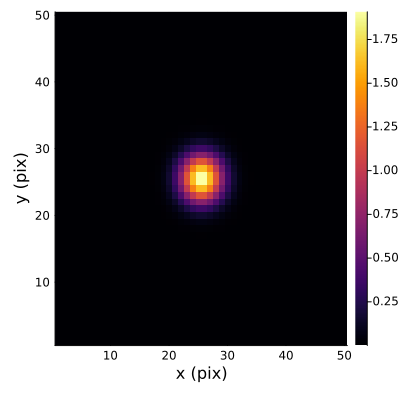

In [179]:
heatmap(S, size=(400, 400), colorbar=true, xlabel="x (pix)", ylabel="y (pix)")
#Plots.savefig("source_heatmap.pdf")

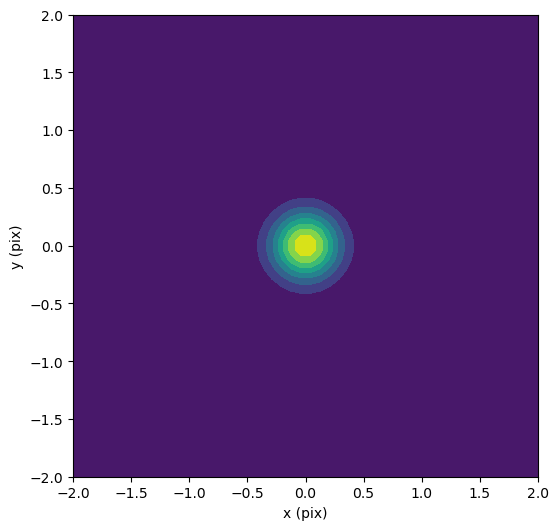

In [180]:
Sfig = PyPlot.figure(figsize=(6, 6))
PyPlot.contourf(thetax, thetay, S)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("source light.pdf")
gcf()

In [181]:
PyPlot.clf()

In [464]:
paradict = Dict(:b => 1.1, :s => 0.1, :q => 0.8, :varphi =>  - pi/3. , :xcentre => 0.1, :ycentre => 0.0)

Dict{Symbol, Float64} with 6 entries:
  :b       => 1.1
  :s       => 0.1
  :varphi  => -1.0472
  :q       => 0.8
  :xcentre => 0.1
  :ycentre => 0.0

In [465]:
alphax, alphay = NIE.LensDerivative(thetax, thetay; paradict...)

([-0.9168367384157089 -0.9315204199570734 … -0.8867590790504747 -0.8687835629840985; -0.9014554877732185 -0.9164819711360113 … -0.8685841008828861 -0.8501609319630362; … ; 0.7993796129004621 0.8188012452744977 … 0.8754042506805586 0.8596025141836633; 0.8210347372862745 0.840070048467009 … 0.8929373718531143 0.8774381082380047], [-0.8189994546582988 -0.8022088226020029 … 0.7350852710597133 0.7554089578306186; -0.8337459816794995 -0.8171703174903419 … 0.7534045248162218 0.7734850151111856; … ; -0.8194551855684787 -0.8002112549190157 … 0.8553036467936468 0.8711798190525957; -0.8004189553388172 -0.78078977060697 … 0.8394943764225816 0.8556873587631937])

In [466]:
betax = thetax .- alphax
betay = thetay .- alphay;

In [467]:
Light = GaussianLight.GaussianSphere(betax, betay, amp=0.5, sigma=0.1);

In [468]:
h_xx, h_xy, h_yy = NIE.LensHessian(thetax, thetay; paradict...)
mag = @. (1 .- h_xx) .* (1 .- h_yy) .- h_xy.^2;

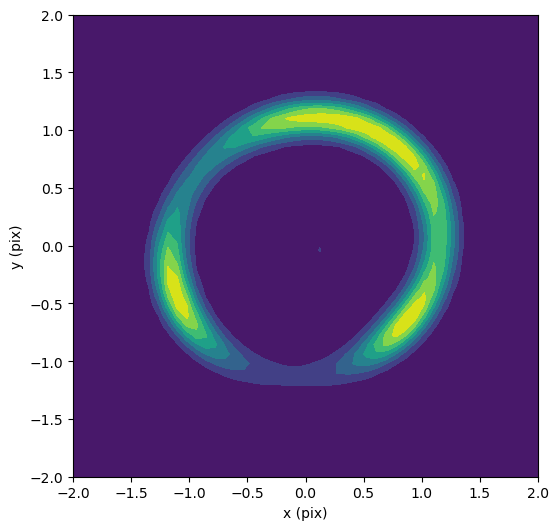

In [469]:
PyPlot.contourf(thetax, thetay, Light)
PyPlot.ylabel("y (pix)")
PyPlot.xlabel("x (pix)")
#PyPlot.colorbar()
gcf()

In [470]:
PyPlot.clf()

In [471]:
minimum(1 ./ mag)

-534.5564635467114

In [472]:
maximum(1 ./ mag)

3208.4110229798803

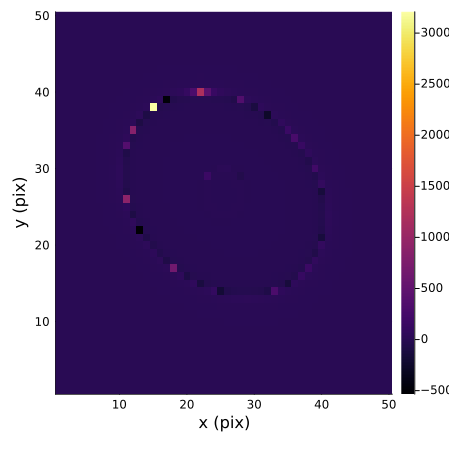

In [473]:
heatmap(1 ./ mag, size=(450, 450), colorbar=true, xlabel="x (pix)", ylabel="y (pix)")

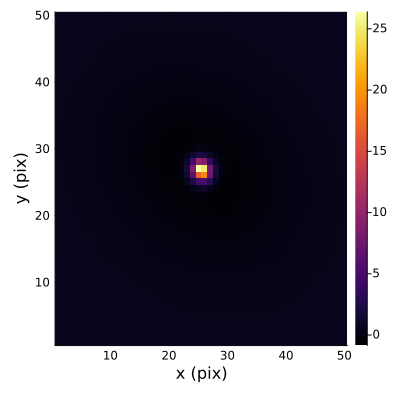

In [474]:
heatmap(mag, size=(400, 400), colorbar=true, xlabel="x (pix)", ylabel="y (pix)")

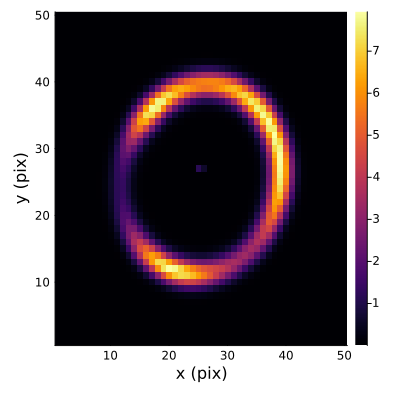

In [475]:
heatmap(Light, size=(400, 400), colorbar=true, xlabel="x (pix)", ylabel="y (pix)")

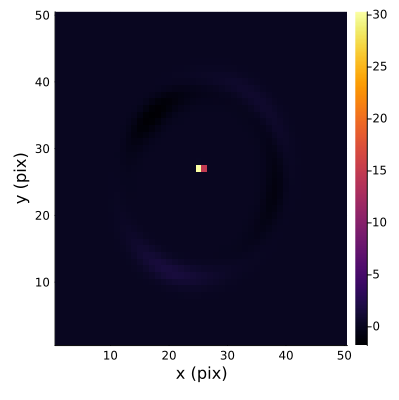

In [476]:
heatmap(Light .* mag, size=(400, 400), colorbar=true, xlabel="x (pix)", ylabel="y (pix)")
#Plots.savefig("image_heatmap.pdf")

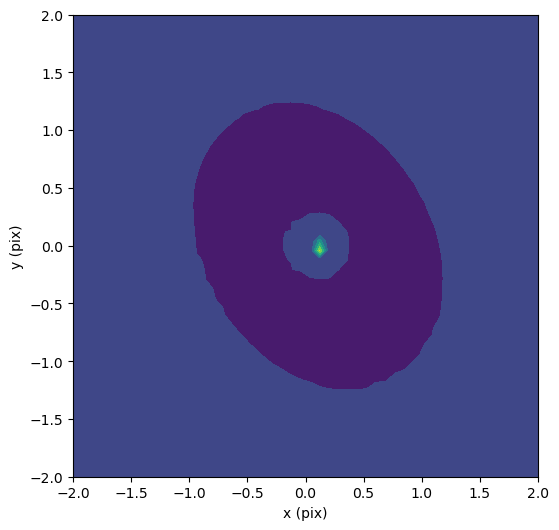

In [477]:
PyPlot.contourf(thetax, thetay, Light .* mag, 5)
PyPlot.ylabel("y (pix)")
PyPlot.xlabel("x (pix)")
#PyPlot.colorbar()
#PyPlot.savefig("extended lens.pdf")
gcf()

In [478]:
PyPlot.clf()

In [479]:
h_xx, h_xy, h_yy = NIE.LensHessian(betax, betay; paradict...)
mag = @. (1 .- h_xx) .* (1 .- h_yy) .- h_xy.^2;

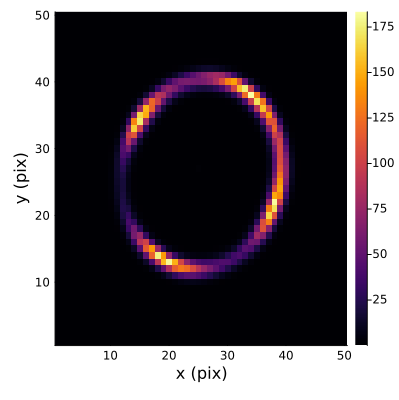

In [480]:
heatmap(Light .* abs.(mag), size=(400, 400), colorbar=true, xlabel="x (pix)", ylabel="y (pix)")

# PSF Models

In [11]:
using PSFModels, Plots, ImageFiltering
using PSFModels: fit
using HCIDatasets: BetaPictoris

In [12]:
model = gaussian(x=0, y=0, fwhm=3);
big_img = randn(1000, 1000);
stamp_inds = (750:830, 400:485);
stamp = @view big_img[stamp_inds...];

In [13]:
stamp_model = model.(CartesianIndices(stamp_inds));

In [14]:
mse = mean(I -> (big_img[I] - model(I))^2, CartesianIndices(stamp_inds));

UndefVarError: UndefVarError: `mean` not defined

In [521]:
P0 = (x=12, y=13, fwhm=3, amp=0.1)
params, synthpsf = fit(gaussian, P0, big_img, stamp_inds)

((x = 12.0, y = 13.0, fwhm = 3.0, amp = 0.1), PSFModels.var"#15#17"{Float64, Base.Pairs{Symbol, Float64, NTuple{4, Symbol}, @NamedTuple{x::Float64, y::Float64, fwhm::Float64, amp::Float64}}}(Base.Pairs(:x => 12.0, :y => 13.0, :fwhm => 3.0, :amp => 0.1)))

In [15]:
params

UndefVarError: UndefVarError: `params` not defined

In [16]:
PSFmodel = gaussian(x=0, y=0, fwhm=5);
inds = CartesianIndices((-40:40, -40:40));
psf = PSFmodel.(inds) ./ sum(PSFmodel.(inds));
size(psf)

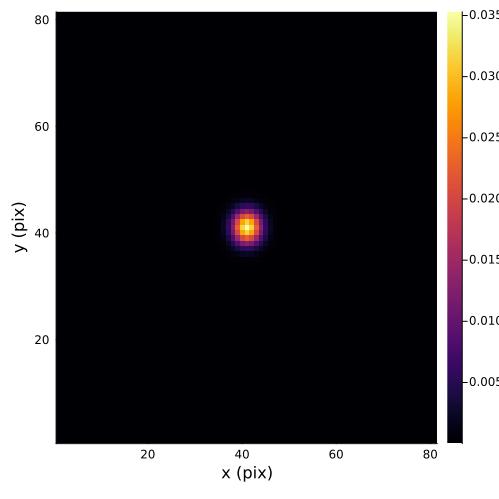

In [21]:
heatmap((psf), size=(500, 500), colorbar=true, xlabel="x (pix)", ylabel="y (pix)")

In [381]:
# convenience function for plotting
function imshow(data; kwargs...)
    xlim = extrema(axes(data, 1))
    ylim = extrema(axes(data, 2))
    heatmap(transpose(data); xlim=xlim, ylim=ylim,
            aspect_ratio=1, clims=(1e-5, Inf), kwargs...)
end

# get a PSF from HCIDatasets.jl;
# you may be prompted to download the file
psf = BetaPictoris[:psf]
inds = CartesianIndices(psf)

imshow(psf)

This program has requested access to the data dependency BetaPictoris.
which is not currently installed. It can be installed automatically, and you will not see this message again.

# Beta Pictoris NaCo ADI Data

Websites
* https://github.com/carlgogo/VIP_extras
* https://github.com/carlgogo/exoimaging_challenge_extras

Author: Carlos Gomez-Gonzalez

## Keys
* `:cube` pre-processed ADI cube
* `:cube_empty` pre-processed ADI cube with companion (Beta Pictoris b) removed
* `:pa` parallactic angles
* `:psf` off-axis PSF



Do you want to download the dataset from ["https://rawcdn.githack.com/carlgogo/VIP_extras/a7ec7ac9aeabcb5df73b9ea57270c6d66f9e3f57/datasets/naco_betapic_cube.fits", "https://rawcdn.githack.com/carlgogo/exoimaging_challenge_extras/8f46c1a3b56842722b87c86fd32f5b0dba9beaf0/naco_betapic_cube.fits", "https://rawcdn.githack.com/carlgogo/VIP_extras/a7ec7ac9aeabcb5df73b9ea57270c6d66f9e3f57/datasets/naco_betapic_pa.fits", "https://rawcdn.githack.com/carlgogo/VIP_extras/a7ec7ac9a

UndefVarError: UndefVarError: `execute_msg` not defined

# Time Estimator

In [2]:
push!(LOAD_PATH, "LensModels/")

4-element Vector{String}:
 "@"
 "@v#.#"
 "@stdlib"
 "LensModels/"

In [3]:
using LazyGrids, PyPlot, NIE, BenchmarkTools
using PSFModels, Plots, ImageFiltering
include("LensBase.jl")
include("LensUtils.jl")
include("LensFITS.jl")
include("LensModels/NIE.jl")
include("LightModels/GaussianLight.jl")

Main.GaussianLight

In [4]:
function Gaussian(x::Union{LazyGrids.GridSL,Matrix{Float64}}, y::Union{LazyGrids.GridSL,Matrix{Float64}};
    amp::Float64, sigma::Float64, center_x::Float64=0.0, center_y::Float64=0.0)

    c = amp ./ (2 .* pi .* sigma .^ 2)
    r2 = (x .- center_x) .^ 2 ./ sigma .^ 2 .+ (y .- center_y) .^ 2 ./ sigma .^ 2

    return c .* exp.(.-r2 ./ 2.0)

end

Gaussian (generic function with 1 method)

In [6]:
x = range(-2, 2, 50)
thetax, thetay = ndgrid(x, x)

([-2.0 -2.0 … -2.0 -2.0; -1.9183673469387754 -1.9183673469387754 … -1.9183673469387754 -1.9183673469387754; … ; 1.9183673469387754 1.9183673469387754 … 1.9183673469387754 1.9183673469387754; 2.0 2.0 … 2.0 2.0], [-2.0 -1.9183673469387754 … 1.9183673469387754 2.0; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0; … ; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0; -2.0 -1.9183673469387754 … 1.9183673469387754 2.0])

In [537]:
typeof(thetax)

LazyGrids.GridSL{Float64, 1, 2, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}

In [82]:
paradict = Dict(:b => 1., :s => 0.1, :q => 1., :varphi => 0., :xcentre => 0.0, :ycentre => 0.0);
SourceKwargs = Dict(:amp => 0.5, :sigma => 0.1);

In [83]:
h_xx, h_xy, h_yy = NIE.LensHessian(thetax, thetay; paradict...)
mag = @. (1 .- h_xx) .* (1 .- h_yy) .- h_xy.^2;

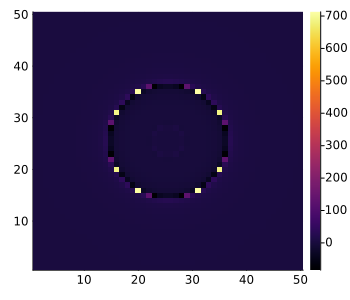

In [84]:
heatmap(1 ./ mag, size=(350, 300), colorbar=true)

In [32]:
using HDF5

In [33]:
data = h5read("mag.h5", "dataset")

50×50 Matrix{Float64}:
 1.53661  1.55337  1.57079  1.58888  …  1.58889  1.57079  1.55337  1.53661
 1.55337  1.57159  1.59061  1.61044     1.61044  1.59061  1.57158  1.55337
 1.57079  1.59061  1.61138  1.63316     1.63316  1.61139  1.59061  1.5708
 1.58888  1.61044  1.63316  1.65709     1.65709  1.63316  1.61044  1.58888
 1.60763  1.6311   1.65595  1.68225     1.68226  1.65595  1.6311   1.60763
 1.62702  1.65257  1.67975  1.7087   …  1.7087   1.67975  1.65256  1.62703
 1.64702  1.67482  1.70456  1.73643     1.73642  1.70456  1.67481  1.64702
 1.66757  1.69781  1.73035  1.76544     1.76544  1.73036  1.69781  1.66757
 1.68863  1.72149  1.75708  1.79569     1.79569  1.75709  1.72149  1.68862
 1.71009  1.74578  1.78467  1.82714     1.82714  1.78467  1.74577  1.71009
 ⋮                                   ⋱                             
 1.68863  1.7215   1.75708  1.79569     1.7957   1.75709  1.72149  1.68862
 1.66757  1.69781  1.73036  1.76544     1.76544  1.73035  1.69781  1.66757
 1.64702  

In [62]:
1 ./ mag

50×50 Matrix{Float64}:
 1.53665  1.55341  1.57084  1.58894  …  1.58893  1.57084  1.55341  1.53665
 1.55341  1.57163  1.59065  1.6105      1.6105   1.59066  1.57163  1.5534
 1.57084  1.59064  1.61144  1.63321     1.63321  1.61144  1.59065  1.57083
 1.58893  1.61049  1.63321  1.65715     1.65714  1.63321  1.61049  1.58892
 1.60768  1.63114  1.656    1.68231     1.68232  1.65599  1.63114  1.60768
 1.62707  1.65261  1.6798   1.70876  …  1.70876  1.6798   1.6526   1.62706
 1.64706  1.67486  1.70462  1.73649     1.73649  1.70461  1.67485  1.64706
 1.66761  1.69785  1.7304   1.76549     1.7655   1.73039  1.69785  1.66761
 1.68866  1.72153  1.75713  1.79574     1.79574  1.75714  1.72153  1.68867
 1.71012  1.74582  1.78472  1.82719     1.82719  1.78472  1.74582  1.71013
 ⋮                                   ⋱                             
 1.68866  1.72154  1.75713  1.79575     1.79576  1.75714  1.72154  1.68867
 1.66761  1.69785  1.73041  1.76548     1.76549  1.73041  1.69785  1.66761
 1.64706  

In [65]:
data .- 1 ./ mag

50×50 Matrix{Float64}:
 -4.14382e-5  -3.88258e-5  -5.09901e-5  …  -4.45717e-5  -4.57548e-5
 -4.22822e-5  -4.10638e-5  -4.20638e-5     -4.7775e-5   -3.57502e-5
 -4.10356e-5  -3.52435e-5  -5.37548e-5     -4.45809e-5  -3.66445e-5
 -4.96918e-5  -4.52357e-5  -4.91189e-5     -4.77553e-5  -4.4574e-5
 -4.57182e-5  -4.43251e-5  -4.77855e-5     -4.20236e-5  -4.22609e-5
 -4.98104e-5  -4.044e-5    -4.58026e-5  …  -3.8235e-5   -3.40927e-5
 -4.07641e-5  -3.96829e-5  -5.71117e-5     -4.4417e-5   -4.40899e-5
 -4.51218e-5  -4.05125e-5  -4.78841e-5     -3.93345e-5  -4.17551e-5
 -3.36731e-5  -4.43887e-5  -4.9955e-5      -4.20183e-5  -4.62069e-5
 -3.12316e-5  -4.43349e-5  -4.89229e-5     -4.20483e-5  -3.92603e-5
  ⋮                                     ⋱               
 -3.47921e-5  -3.96481e-5  -4.86416e-5     -4.20184e-5  -4.6207e-5
 -4.51218e-5  -4.20425e-5  -5.61998e-5     -4.20425e-5  -4.17551e-5
 -3.8201e-5   -4.49127e-5  -5.97804e-5     -4.96468e-5  -4.15268e-5
 -5.10841e-5  -4.56116e-5  -4.56904e-5

In [96]:
maximum(data .- 1 ./ mag), minimum(data .- 1 ./ mag)

(0.0036120912439132624, -36.4639910761382)

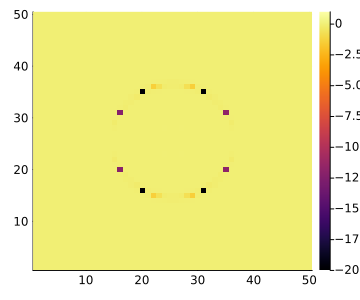

In [101]:
hp = heatmap(data .- 1 ./ mag, size=(360,300), clims=(-20, 1))

In [106]:
mean(data .- 1 ./ mag) / 50 /50

-3.3174928958965034e-5

In [102]:
Plots.savefig(hp, "pvj.png")

"/Users/cyan/Documents/VScodeProjects/Jens/pvj.png"

In [19]:
typeof(NIE)

Module

In [20]:
Lighttt = LensBase.LensRayShooting(thetax, thetay;
 LensModel=NIE, LensKwargs=paradict, 
 SourceProfile=Gaussian, SourceKwargs=SourceKwargs)
#conved = imfilter(Lighttt, psf);

50×50 Matrix{Float64}:
 3.35186e-75  1.05e-70     1.91703e-66  …  1.05e-70     3.35186e-75
 1.05026e-70  2.93041e-66  4.7552e-62      2.93041e-66  1.05026e-70
 1.91798e-66  4.75637e-62  6.84278e-58     4.75637e-62  1.91798e-66
 2.0573e-62   4.52573e-58  5.75919e-54     4.52573e-58  2.0573e-62
 1.30682e-58  2.54587e-54  2.85976e-50     2.54587e-54  1.30682e-58
 4.95842e-55  8.54286e-51  8.45571e-47  …  8.54286e-51  4.95842e-55
 1.13401e-51  1.72617e-47  1.5034e-43      1.72617e-47  1.13401e-51
 1.57818e-48  2.12122e-44  1.62404e-40     2.12122e-44  1.57818e-48
 1.34973e-45  1.60182e-41  1.07758e-37     1.60182e-41  1.34973e-45
 7.16694e-43  7.51398e-39  4.44206e-35     7.51398e-39  7.16694e-43
 ⋮                                      ⋱               
 1.34973e-45  1.60182e-41  1.07758e-37     1.60182e-41  1.34973e-45
 1.57818e-48  2.12122e-44  1.62404e-40     2.12122e-44  1.57818e-48
 1.13401e-51  1.72617e-47  1.5034e-43      1.72617e-47  1.13401e-51
 4.95842e-55  8.54286e-51  8.45571e-4

In [21]:
heatmap(conved,size=(550,500))

UndefVarError: UndefVarError: `conved` not defined

In [535]:
@benchmark begin

    Lighttt = LensBase.LensRayShooting(thetax, thetay, LensModel=NIE,
        LensKwargs=paradict, SourceProfile=GaussianLight.GaussianSphere, SourceKwargs=SourceKwargs)
    conved = imfilter(Lighttt, PSFmodel.(inds));
    pn = PoissonNoise(conved, 200);
    bn = BackgroundNoise(conved, 10);

end

#heatmap(conv, size=(500, 500), xticks=(1:12.5:50., xtick), yticks=(1:12.5:50,ytick),colorbar=false, xlabel="x (pix)", ylabel="y (pix)" )


BenchmarkTools.Trial: 711 samples with 1 evaluation.
 Range (min … max):  6.006 ms … 20.414 ms  ┊ GC (min … max): 0.00% … 69.81%
 Time  (median):     6.495 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   7.035 ms ±  1.558 ms  ┊ GC (mean ± σ):  5.50% ± 11.35%

  ▁▃▆█▆▄▂▁▁▁                                                  
  ██████████▇█▆▅▆▄▄▅▅▁▄▄▁▄▄▄▇▅▆▆▁▆▄▅▅▆▆▄▆▇▅▇▅▅▅▄▅▆▁▄▁▄▁▄▁▄▄▄ ▇
  6.01 ms      Histogram: log(frequency) by time     13.3 ms <

 Memory estimate: 7.85 MiB, allocs estimate: 322.

BenchmarkTools.Trial: 874 samples with 1 evaluation.
 Range (min … max):  4.973 ms … 18.561 ms  ┊ GC (min … max): 0.00% … 68.70%
 Time  (median):     5.417 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   5.721 ms ±  1.346 ms  ┊ GC (mean ± σ):  4.87% ± 10.91%

  ▂▃██▅▃▁▁                                                    
  ████████▇▄▁▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▅▇▅▅▄▁▄▄▄▅▁▁▄▄▄▄▄▁▄▁▄▁▁▁▁▄▅▄▄ ▇
  4.97 ms      Histogram: log(frequency) by time     13.1 ms <

BenchmarkTools.Trial: 711 samples with 1 evaluation.
 Range (min … max):  6.006 ms … 20.414 ms  ┊ GC (min … max): 0.00% … 69.81%
 Time  (median):     6.495 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   7.035 ms ±  1.558 ms  ┊ GC (mean ± σ):  5.50% ± 11.35%

  ▁▃▆█▆▄▂▁▁▁                                                  
  ██████████▇█▆▅▆▄▄▅▅▁▄▄▁▄▄▄▇▅▆▆▁▆▄▅▅▆▆▄▆▇▅▇▅▅▅▄▅▆▁▄▁▄▁▄▁▄▄▄ ▇
  6.01 ms      Histogram: log(frequency) by time     13.3 ms <



# Poisson and BKG

In [528]:
#=
poisson = image_util.add_poisson(image_model, exp_time=exp_time)
bkg = image_util.add_background(image_model, sigma_bkd=background_rms)
image_real = image_model + poisson + bkg
=#

In [236]:
using Distributions

In [532]:
function PoissonNoise(image, exp_time)

    sigma = @. sqrt(abs(image) / exp_time)

    poisson = rand(Normal(0.0, 1.0), size(image)) .* sigma

    return poisson

end

PoissonNoise (generic function with 1 method)

In [542]:
pn = PoissonNoise(conved, 200);

In [533]:
function BackgroundNoise(image, sigma_bkd)

    background = rand(Normal(0.0, 1.0), size(image)) .* sigma_bkd

    return background

end

BackgroundNoise (generic function with 1 method)

In [543]:
bn = BackgroundNoise(conved, 1);

In [544]:
imagelight = conved .+ pn .+ bn;

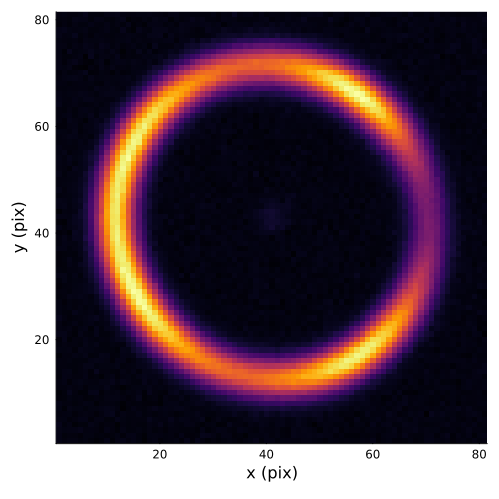

In [545]:
heatmap(imagelight, size=(500, 500), colorbar=false, xlabel="x (pix)", ylabel="y (pix)")
#Plots.savefig("image_heatmap.pdf")

In [523]:
heatmap(conv .+ pn .+ bn .+ 100 .* S, size=(500, 500), xticks=(1:12.5:50.0, xtick), yticks=(1:12.5:50, ytick), colorbar=false, xlabel="x (pix)", ylabel="y (pix)")
#Plots.savefig("image_combine_heatmap.pdf")

DimensionMismatch: DimensionMismatch: arrays could not be broadcast to a common size; got a dimension with lengths 100 and 50

In [571]:
using AstroImages
using BackgroundMeshes
using FITSIO
using Plots
using Random

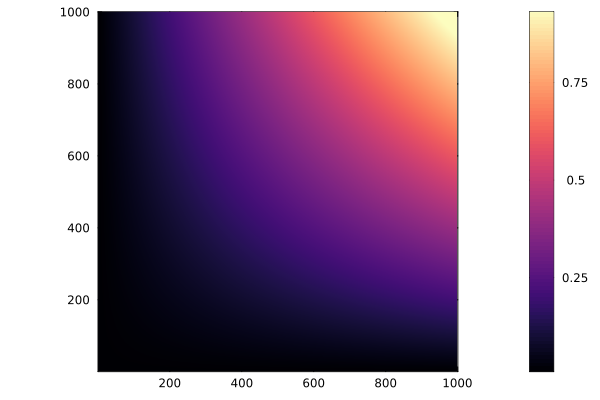

In [583]:
rng = Random.seed!(125512)

xs = range(0, 1; length=1000)
ys = xs'
data = xs .* ys
implot(data)

In [561]:
median(data)

0.1865729593457321

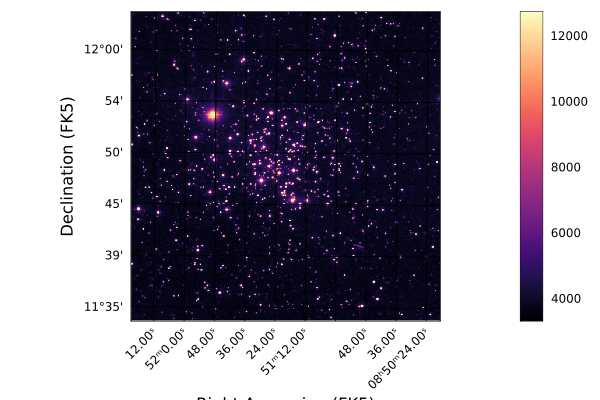

In [562]:
file = download(
    "https://rawcdn.githack.com/astropy/photutils-datasets/8c97b4fa3a6c9e6ea072faeed2d49a20585658ba/data/M6707HH.fits",
)
image = AstroImage(file)
implot(image; cmap=:magma, xrotation=45)

In [602]:
# sigma-clip
sigma = 3
clip = Dict(:fill=>NaN, :center=>median(image), :std=>std(image, corrected=false))
clipped = sigma_clip(image, sigma; clip...);

In [603]:
# get background and background rms with box-size (50, 50)
bkg, bkg_rms = estimate_background(clipped, 50; filter_size=3)

([3639.725199999999 3639.725199999999 … 3611.8593749999995 3611.8593749999995; 3639.725199999999 3639.725199999999 … 3611.8593749999995 3611.8593749999995; … ; 3633.1230207064555 3633.1230207064555 … 3711.7668918918916 3711.7668918918916; 3633.1230207064555 3633.1230207064555 … 3711.7668918918916 3711.7668918918916], [227.9942791617141 227.9942791617141 … 333.3669084885649 333.3669084885649; 227.9942791617141 227.9942791617141 … 333.3669084885649 333.3669084885649; … ; 254.88410621234246 254.88410621234246 … 193.6429650856061 193.6429650856061; 254.88410621234246 254.88410621234246 … 193.6429650856061 193.6429650856061])

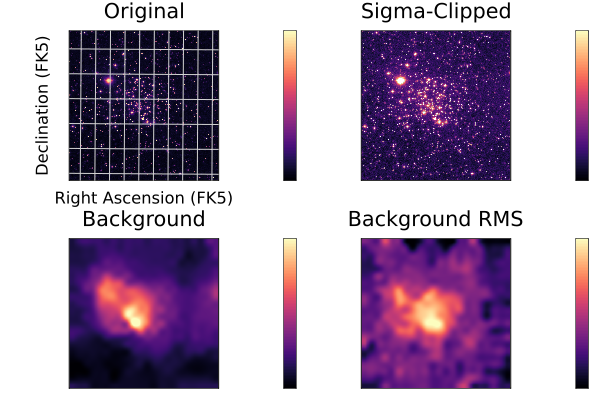

In [604]:
# plot
Plots.plot(
    implot(image; title="Original"),
    implot(clipped; title="Sigma-Clipped"),
    implot(bkg; title="Background"),
    implot(bkg_rms; title="Background RMS");
    cmap=:magma,
    layout=(2, 2),
    ticks=false,
)

# Multiple Lenses

In [1]:
push!(LOAD_PATH, "LensModels/")
push!(LOAD_PATH, "LightModels/")

5-element Vector{String}:
 "@"
 "@v#.#"
 "@stdlib"
 "LensModels/"
 "LightModels/"

In [42]:
using LazyGrids, PyPlot, NIE, BenchmarkTools, Plots, GaussianLight


In [3]:
r = range(0, 2, 4000)
theta = range(0, 2 * pi, 4000)
x = range(-4, 4, 100)
(rg, thetag) = ndgrid(r, theta);

In [4]:
function Pol2Car(r, phi, xc=0.0, yc=0.0)

    x = @. r .* cos.(phi)
    y = @. r .* sin.(phi)

    return x .- xc, y .- yc

end

Pol2Car (generic function with 3 methods)

In [5]:
(xpg, ypg) = Pol2Car(rg, thetag)
(xg, yg) = ndgrid(x, x)

([-4.0 -4.0 … -4.0 -4.0; -3.919191919191919 -3.919191919191919 … -3.919191919191919 -3.919191919191919; … ; 3.919191919191919 3.919191919191919 … 3.919191919191919 3.919191919191919; 4.0 4.0 … 4.0 4.0], [-4.0 -3.919191919191919 … 3.919191919191919 4.0; -4.0 -3.919191919191919 … 3.919191919191919 4.0; … ; -4.0 -3.919191919191919 … 3.919191919191919 4.0; -4.0 -3.919191919191919 … 3.919191919191919 4.0])

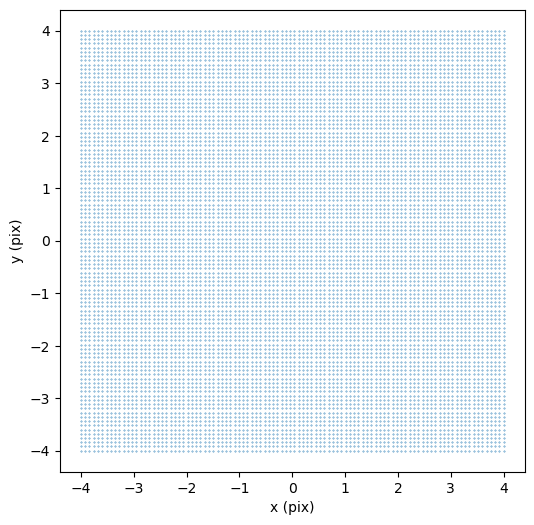

In [6]:
figg = PyPlot.figure(figsize=(6, 6))
PyPlot.scatter(xg, yg, s=0.1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("grid.pdf")
gcf()

In [7]:
PyPlot.clf()

In [8]:
f_x, f_y = NIE.LensDerivative(xg, yg, xcentre=-0.5, ycentre=0.0) # deflection angles f_i
xb, yb = xg .- f_x, yg .- f_y  # lensed image plane

([-3.0101769732906414 -2.9967639786570075 … -2.902643684608934 -2.9136830515159016; -2.945219213241061 -2.9317427410789545 … -2.834904975826821 -2.846008147647768; … ; 2.7071875695542342 2.697190663818603 … 2.7649317115691456 2.7771349869597777; 2.7787789151706574 2.7688904186329237 … 2.8346951496219965 2.8467649392461762], [-2.7473967501977525 -2.6788736695421953 … 2.6203103833759087 2.690933464219367; -2.7340564305977324 -2.6653231085326663 … 2.6091578311441315 2.6799425203698464; … ; -2.810351280998886 -2.7410402841209534 … 2.82608252039227 2.892930104258822; -2.8202567498427826 -2.7510198377114623 … 2.8382640706676954 2.90502111075043])

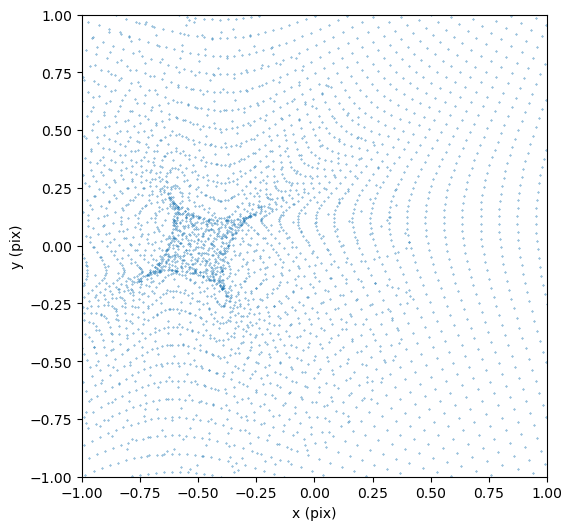

In [9]:
figd = PyPlot.figure(figsize=(6, 6))
PyPlot.scatter(xb, yb, s=0.1)
#PyPlot.scatter(xg, yg, s=0.1)
PyPlot.xlim(-1, 1)
PyPlot.ylim(-1, 1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
#PyPlot.savefig("first lens.pdf")
gcf()

In [10]:
PyPlot.clf()

In [11]:
f2_x, f2_y = NIE.LensDerivative(xb, yb, xcentre=0.8, ycentre=0.0) # deflection angles f_i
x2b, y2b = xb .- f2_x, yb .- f2_y  # lensed image plane

([-1.7454653914531533 -1.7213652422083507 … -1.5837473130604405 -1.6043656136655011; -1.6871606212504888 -1.6628151597032237 … -1.522274852375409 -1.543114892145249; … ; 1.7728473881281384 1.7522502811353902 … 1.939344125495266 1.9626412413676415; 1.825387875991857 1.804801722101172 … 1.9882063744715772 2.0115172449485867], [-1.802557127227547 -1.7496072061295926 … 1.576432369688988 1.633069909428116; -1.7807428035771 -1.7276678069118785 … 1.557254867580252 1.6140090836629422; … ; -1.4035400268072817 -1.3424738203433457 … 1.4641749667827537 1.5224599607084512; -1.4258542530501475 -1.3651514464943586 … 1.4903688934405053 1.5482462255818836])

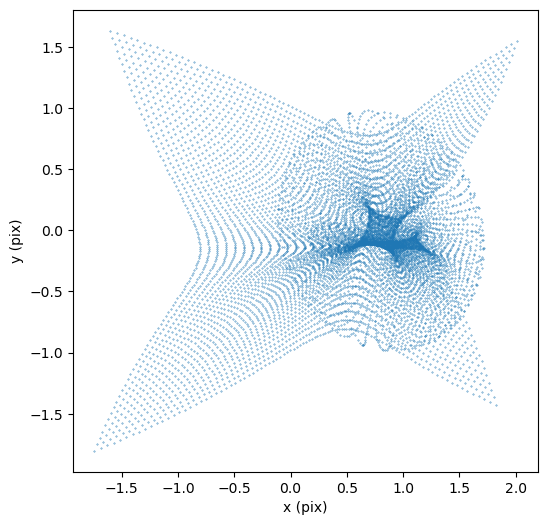

In [12]:
PyPlot.figure(figsize=(6, 6))
PyPlot.scatter(x2b, y2b, s=0.1)
#PyPlot.scatter(xg, yg, s=0.1)
#PyPlot.xlim(-1,1)
#PyPlot.ylim(-1,1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
PyPlot.savefig("second lens.pdf")
gcf()

In [13]:
PyPlot.clf()

In [14]:
@benchmark begin

    ax, ay = NIE.LensDerivative(xg, yg, xcentre=-0.5, ycentre=0.0)
    bx = xg .- ax
    by = yg .- ay
    a2x, a2y = NIE.LensDerivative(bx, by, xcentre=0.8, ycentre=0.2)
    b2x = bx .- a2x
    b2y = by .- a2y
    Light2 = GaussianLight.GaussianSphere(b2x, b2y, amp=0.5, sigma=0.2)

end

BenchmarkTools.Trial: 5933 samples with 1 evaluation.
 Range (min … max):  651.000 μs …  13.536 ms  ┊ GC (min … max): 0.00% … 94.10%
 Time  (median):     785.375 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   839.116 μs ± 502.479 μs  ┊ GC (mean ± σ):  6.66% ±  9.82%

  ▂▇█▆▃                                                         ▁
  ██████▇▃▁▁▁▄▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▄▃▁▄▄▁▃▄▆ █
  651 μs        Histogram: log(frequency) by time       3.83 ms <

 Memory estimate: 1.99 MiB, allocs estimate: 118.

In [15]:
xl = [xg]
push!(xl, xg)
xl

2-element Vector{LazyGrids.GridSL{Float64, 1, 2, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}}:
 [-4.0 -4.0 … -4.0 -4.0; -3.919191919191919 -3.919191919191919 … -3.919191919191919 -3.919191919191919; … ; 3.919191919191919 3.919191919191919 … 3.919191919191919 3.919191919191919; 4.0 4.0 … 4.0 4.0]
 [-4.0 -4.0 … -4.0 -4.0; -3.919191919191919 -3.919191919191919 … -3.919191919191919 -3.919191919191919; … ; 3.919191919191919 3.919191919191919 … 3.919191919191919 3.919191919191919; 4.0 4.0 … 4.0 4.0]

In [21]:
typeof(xl[1])

LazyGrids.GridSL{Float64, 1, 2, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}

In [28]:
ax, ay = NIE.LensDerivative(xl[1], yl[1]; paralist[1]...)

([-0.9898230267093585 -1.0032360213429923 … -1.0973563153910662 -1.0863169484840984; -0.9739727059508578 -0.9874491781129644 … -1.0842869433650983 -1.0731837715441508; … ; 1.212004349637685 1.222001255373316 … 1.1542602076227733 1.1420569322321414; 1.2212210848293423 1.2311095813670765 … 1.1653048503780035 1.1532350607538238], [-1.2526032498022475 -1.2403182496497238 … 1.2988815358160104 1.309066535780633; -1.2659435694022674 -1.2538688106592528 … 1.3100340880477876 1.3200574796301539; … ; -1.1896487190011136 -1.1781516350709655 … 1.0931093987996492 1.1070698957411782; -1.1797432501572174 -1.1681720814804568 … 1.0809278485242237 1.0949788892495702])

In [35]:
paradict1 = Dict(:xcentre => -0.5, :ycentre => 0.0);
paradict2 = Dict(:xcentre => 0.8, :ycentre => 0.0);
paralist = [paradict1, paradict2]
# ? NIE.LensDerivative
xl = Union{LazyGrids.GridSL, Matrix{Float64}}[xg]
yl = Union{LazyGrids.GridSL, Matrix{Float64}}[yg]

for i = 1:2

    ax, ay = NIE.LensDerivative(xl[i], yl[i]; paralist[i]...)
    # MethodError: Cannot `convert` an object of 
    #type Matrix{Float64} to an object of type 
    # LazyGrids.GridSL{Float64, 1, 2, 
        #Base.TwicePrecision{Float64}, 
        #Base.TwicePrecision{Float64}}
    push!(xl, xl[i] .- ax)
    push!(yl, yl[i] .- ay)

end

Light3 = GaussianLight.GaussianSphere(xl[end], yl[end], amp=0.5, sigma=0.2);

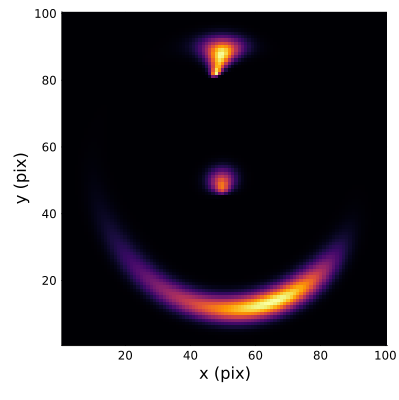

In [36]:
heatmap(Light3, colorbar=false, size=(400, 400), xlabel="x (pix)", ylabel="y (pix)")

In [438]:
ax, ay = NIE.LensDerivative(xg, yg, xcentre=-0.5, ycentre=0.0)
bx = xg .- ax
by = yg .- ay
h_xx, h_xy, h_yy = NIE.LensHessian(bx, by, xcentre=-0.5, ycentre=0.0)
mag1 = @. (1 - h_xx) * (1 - h_yy) - h_xy^2;
#===========================================================#
a2x, a2y = NIE.LensDerivative(bx, by, xcentre=0.8, ycentre=-0.3)
b2x = bx .- a2x
b2y = by .- a2y
h_xx, h_xy, h_yy = NIE.LensHessian(b2x, b2y, xcentre=0.8, ycentre=-0.3)
mag2 = @. (1 - h_xx) * (1 - h_yy) - h_xy^2;
Light2 = GaussianLight.GaussianSphere(b2x, b2y, amp=0.4, sigma=0.2); # .* mag1 .* mag2;

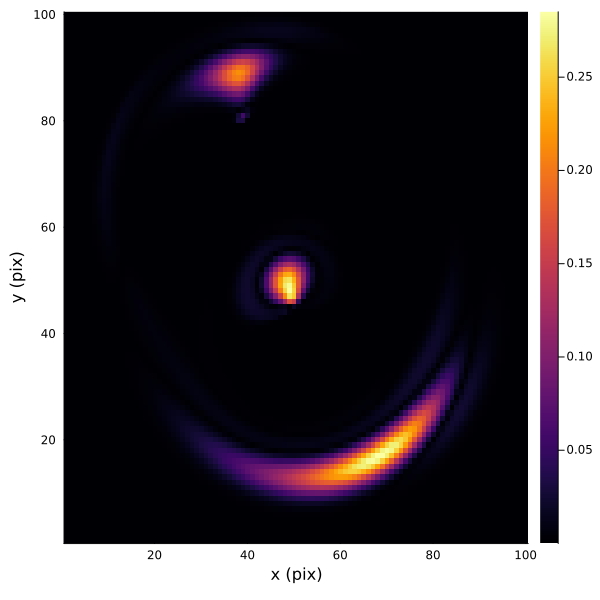

In [443]:
heatmap(Light2 .* abs.(mag1) .* abs.(mag2), colorbar=true, size=(600, 600), xlabel="x (pix)", ylabel="y (pix)")

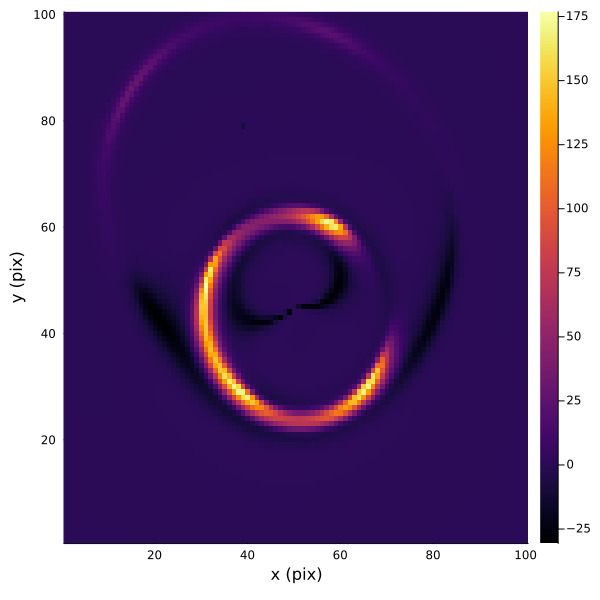

In [481]:
heatmap( mag1 .* mag2, colorbar=true, size=(600, 600), xlabel="x (pix)", ylabel="y (pix)")

In [37]:
@benchmark begin
    f_x, f_y = NIE.LensDerivative(xg, yg, xcentre=-0.5, ycentre=0.0) # deflection angles f_i
    xb, yb = xg .- f_x, yg .- f_y  # lensed image plane
    f2_x, f2_y = NIE.LensDerivative(xb, yb, xcentre=0.8, ycentre=0.0) # deflection angles f_i
    x2b, y2b = xb .- f2_x, yb .- f2_y  # lensed image plane
end




BenchmarkTools.Trial: 6348 samples with 1 evaluation.
 Range (min … max):  621.750 μs …  16.799 ms  ┊ GC (min … max): 0.00% … 95.91%
 Time  (median):     726.083 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   786.728 μs ± 648.725 μs  ┊ GC (mean ± σ):  6.45% ±  7.44%

                      ▆█▁         ▃                              
  ▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▃▃▄▄███▇▄▄▄▄▄▄▄▅█▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁ ▂
  622 μs           Histogram: frequency by time          872 μs <

 Memory estimate: 1.83 MiB, allocs estimate: 107.

In [65]:
f3_x, f3_y = NIE.LensDerivative(xg, yg, xcentre=0.8, ycentre=0.0) # deflection angles f_i
x3b, y3b = xg .- f3_x, yg .- f3_y  # lensed image plane

([-2.807948798793774 -2.796392009544822 … -2.7372827551124015 -2.7467593182904615; -2.737195115866774 -2.7254980195776 … -2.6646596043856725 -2.674248210818446; … ; 2.898160384300459 2.8868837386912323 … 2.9943643826128414 3.0079832607293016; 2.9643779265888304 2.9531371448873234 … 3.057666958274944 3.07126327476898], [-2.948748896495233 -2.882260495865439 … 2.7870817543228386 2.8560925357474005; -2.9371535408417873 -2.8706027646177716 … 2.777522624304858 2.8465870750041624; … ; -2.6387022424538764 -2.5672460520589233 … 2.6145408303510913 2.6841496019973596; -2.6498657297338326 -2.5786016033305748 … 2.6282748455995586 2.697633093146477])

In [66]:
f4_x, f4_y = NIE.LensDerivative(x3b, y3b, xcentre=-0.5, ycentre=0.0) # deflection angles f_i
x4b, y4b = x3b .- f4_x, y3b .- f4_y  # lensed image plane

([-1.9005394883547244 -1.8773780247556882 … -1.7074859141799918 -1.7278471648316533; -1.8484818243151877 -1.8252516377529768 … -1.6517576398202656 -1.672205119428197; … ; 1.6206167230813684 1.5989872350062204 … 1.7507416546572427 1.7759510644698075; 1.6797645543622979 1.658341555051582 … 1.8070221260883361 1.83200706352909], [-1.6429792286796598 -1.5864600191399645 … 1.4481568804721154 1.5076574510338456; -1.6176476622997529 -1.5607869204392049 … 1.4260095980389096 1.4858112039073246; … ; -1.5419963192517683 -1.484727046475238 … 1.645034525662018 1.6986552339050969; -1.5615756047032017 -1.5044580453636451 … 1.6674597101514437 1.7209208065745136])

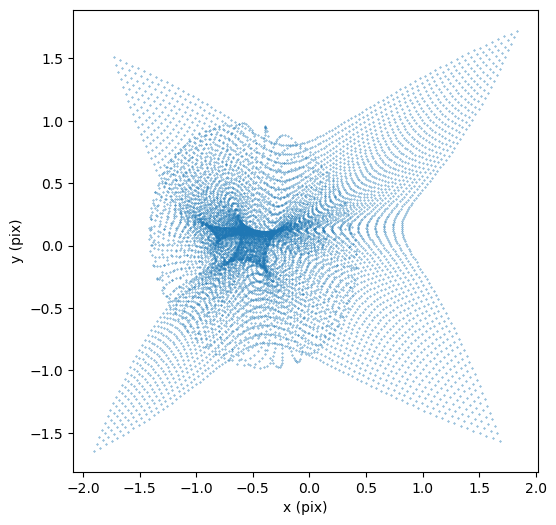

In [67]:
PyPlot.figure(figsize=(6, 6))
PyPlot.scatter(x4b, y4b, s=0.1)
#PyPlot.scatter(xg, yg, s=0.1)
#PyPlot.xlim(-1,1)
#PyPlot.ylim(-1,1)
PyPlot.xlabel("x (pix)")
PyPlot.ylabel("y (pix)")
PyPlot.savefig("second lens.pdf")
gcf()

In [69]:
PyPlot.clf()

# Complex/Pixelized Sources

In [3]:
using Images, Plots, LazyGrids, PyPlot

ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
┌ Warning: Module VectorizationBase with build ID ffffffff-ffff-ffff-0000-cd44a9f532d5 is missing from the cache.
│ This may mean VectorizationBase [3d5dd08c-fd9d-11e8-17fa-ed2836048c2f] does not support precompila

In [9]:
include("LensBase.jl")
include("LensUtils.jl")
include("LensFits.jl")
include("LensModels/NIE.jl")
include("LightModels/GaussianLight.jl")

Main.GaussianLight

In [29]:
function Coor2Ind(mesh)

    return round.(Int, ((mesh .- minimum(mesh)) ./ ((maximum(mesh) - minimum(mesh))) .* size(mesh)[1]))

end

Coor2Ind (generic function with 1 method)

In [30]:
round.(Int, ((thetax .- minimum(thetax)) ./ ((maximum(thetax) - minimum(thetax))) .* size(thetax)[1]));

In [33]:
kangaroo_path = "Plots/kangaroo.png"
kangaroo = Gray.(load(kangaroo_path));

In [37]:
kangaroo = convert(Array{Float64}, kangaroo);
size(kangaroo)


(454, 454)

In [38]:
x = range(-2, 2, size(kangaroo)[1])
thetax, thetay = ndgrid(x, x)

([-2.0 -2.0 … -2.0 -2.0; -1.9911699779249448 -1.9911699779249448 … -1.9911699779249448 -1.9911699779249448; … ; 1.9911699779249448 1.9911699779249448 … 1.9911699779249448 1.9911699779249448; 2.0 2.0 … 2.0 2.0], [-2.0 -1.9911699779249448 … 1.9911699779249448 2.0; -2.0 -1.9911699779249448 … 1.9911699779249448 2.0; … ; -2.0 -1.9911699779249448 … 1.9911699779249448 2.0; -2.0 -1.9911699779249448 … 1.9911699779249448 2.0])

In [75]:
paradict = Dict(:b => 1.5, :s => 0.1, :q => 0.8, :varphi => pi / 6, :xcentre => 0.5, :ycentre => 0.0)

Dict{Symbol, Float64} with 6 entries:
  :b       => 1.5
  :s       => 0.1
  :varphi  => 0.523599
  :q       => 0.8
  :xcentre => 0.5
  :ycentre => 0.0

In [76]:
alphax, alphay = NIE.LensDerivative(thetax, thetay; paradict...)
betax = thetax .- alphax
betay = thetay .- alphay;

In [77]:
betaxi = round.(Int, ((betax .- minimum(thetax)) ./ ((maximum(thetax) - minimum(thetax))) .* size(thetax)[1]))
betayi = round.(Int, ((betay .- minimum(thetay)) ./ ((maximum(thetay) - minimum(thetay))) .* size(thetay)[1]));

In [78]:
Light = [[kangaroo[betaxi[i, j], betayi[i, j]] for j in 1:size(thetax)[1]] for i in 1:size(thetax)[1]];

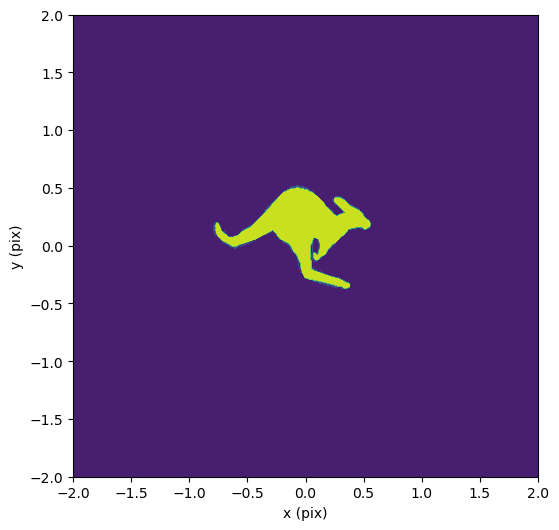

In [79]:
PyPlot.contourf(thetay, -thetax, kangaroo)
PyPlot.ylabel("y (pix)")
PyPlot.xlabel("x (pix)")
PyPlot.xlim(-2, 2)
#PyPlot.colorbar()
#PyPlot.savefig("kangaroo.pdf")
gcf()

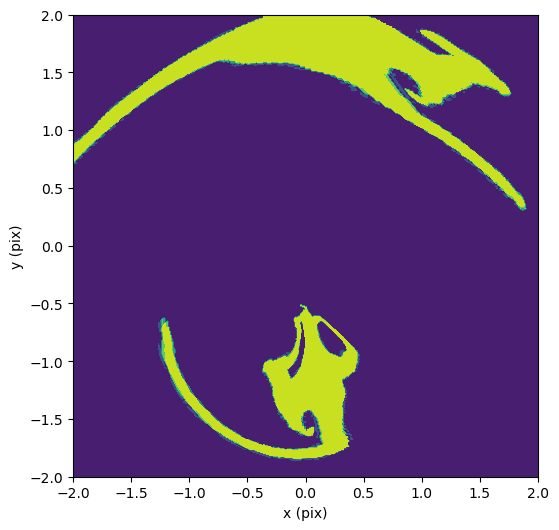

In [80]:
PyPlot.figure(figsize=(6,6))
PyPlot.contourf(thetay, -thetax, Light)
PyPlot.ylabel("y (pix)")
PyPlot.xlabel("x (pix)")
PyPlot.xlim(-2, 2)
#PyPlot.colorbar()
PyPlot.savefig("lensed kangaroo_15.pdf")
gcf()

In [4]:
x = range(-2, 2, 256)
thetax, thetay = ndgrid(x, x)
galaxy_path = "galaxy.png"
galaxy = Gray.(load(galaxy_path));
galaxy = convert(Array{Float64}, galaxy);
size(galaxy)

(256, 256)

In [24]:
x = range(-30,30, size(galaxy)[1])
thetax, thetay = ndgrid(x, x)

([-30.0 -30.0 … -30.0 -30.0; -29.764705882352942 -29.764705882352942 … -29.764705882352942 -29.764705882352942; … ; 29.764705882352942 29.764705882352942 … 29.764705882352942 29.764705882352942; 30.0 30.0 … 30.0 30.0], [-30.0 -29.764705882352942 … 29.764705882352942 30.0; -30.0 -29.764705882352942 … 29.764705882352942 30.0; … ; -30.0 -29.764705882352942 … 29.764705882352942 30.0; -30.0 -29.764705882352942 … 29.764705882352942 30.0])

In [25]:
paradict = Dict(:b => -0.1, :s => 0.1, :q => 0.8, :varphi => pi / 6, :xcentre => 0.5, :ycentre => 0.0)

alphax, alphay = NIE.LensDerivative(thetax, thetay; paradict...)
betax = thetax .- alphax
betay = thetay .- alphay;

betaxi = round.(Int, ((betax .- minimum(thetax)) ./ ((maximum(thetax) - minimum(thetax))) .* size(thetax)[1]))
betayi = round.(Int, ((betay .- minimum(thetay)) ./ ((maximum(thetay) - minimum(thetay))) .* size(thetay)[1]));

Light = [[galaxy[betaxi[i, j], betayi[i, j]] for j in 1:size(thetax)[1]] for i in 1:size(thetax)[1]];

BoundsError: BoundsError: attempt to access 256×256 Matrix{Float64} at index [0, 0]

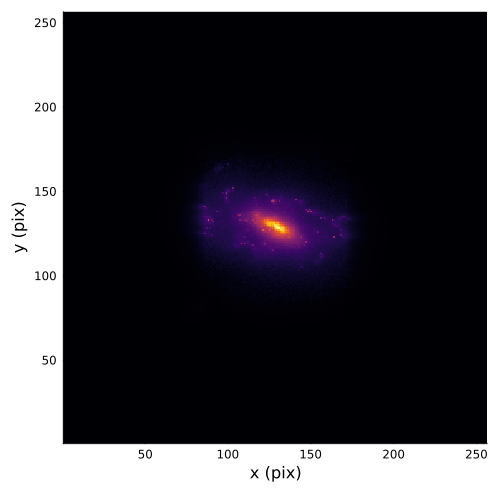

In [14]:
heatmap(galaxy, size=(500, 500), colorbar=false, xlabel="x (pix)", ylabel="y (pix)")
#Plots.savefig("galaxy.pdf")

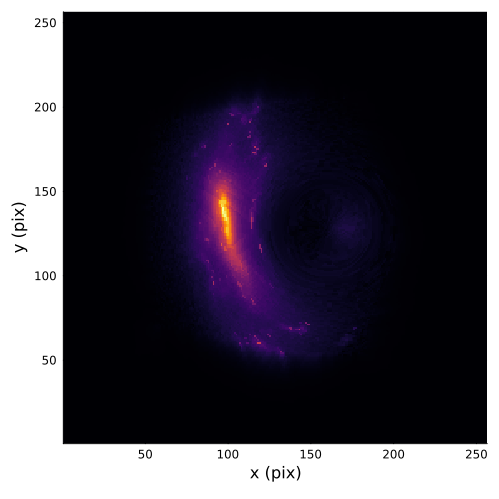

In [15]:
heatmap(stack(Light), size=(500, 500), colorbar=false, xlabel="x (pix)", ylabel="y (pix)")
#Plots.savefig("lensed galaxy.pdf")

# Point Source

# Cosmology

# Sampling

In [1]:
#=
@model function yourturingmodel(obs, ...)
    ... some stuff...
   predictions = mymodel(parameters)
   obs ~ Normal(predictions,Diagonal(variances))
end
=#

In [1]:
using LazyGrids, Rotations, Meshes, Plots, Turing, StatsPlots

In [10]:
# Define a simple Normal model with unknown mean and variance.
@model function gdemo(x,y) # the defined model is conditioned to the data
                            # (arg1 = 1, arg2 = 2) by passing (1, 2) to the model function.

    # initial guess of parameters
    s² ~ InverseGamma(2, 3) 
    m ~ Normal(0, sqrt(s²))

    #likelihood
    #temp = (m-1)^2 * (s^2 -1)^2
    #x ~ Normal(temp)
    y ~ Normal((m-m^2+1), sqrt(s²))
  end

gdemo (generic function with 2 methods)

In [11]:
# Instantiate the model with data
model = gdemo(1.5,2)

DynamicPPL.Model{typeof(gdemo), (:x, :y), (), (), Tuple{Float64, Int64}, Tuple{}, DynamicPPL.DefaultContext}(gdemo, (x = 1.5, y = 2), NamedTuple(), DynamicPPL.DefaultContext())

In [12]:
# Perform sampling using the No-U-Turn Sampler (NUTS)
chn = sample(model, SMC(), 100) # Perform inference by sampling using HMC
# sample(model, sampler, parallel_type, n, n_chains)
# where parallel_type can be either MCMCThreads() or MCMCDistributed() for thread and parallel sampling

Sampling   0%|                                          |  ETA: N/A
Sampling   1%|▍                                         |  ETA: 0:00:20
Sampling   2%|▉                                         |  ETA: 0:00:10
Sampling   3%|█▎                                        |  ETA: 0:00:06
Sampling   4%|█▋                                        |  ETA: 0:00:05
Sampling   5%|██▏                                       |  ETA: 0:00:04
Sampling   6%|██▌                                       |  ETA: 0:00:03
Sampling   7%|███                                       |  ETA: 0:00:03
Sampling   8%|███▍                                      |  ETA: 0:00:02
Sampling   9%|███▊                                      |  ETA: 0:00:02
Sampling  10%|████▎                                     |  ETA: 0:00:02
Sampling  11%|████▋                                     |  ETA: 0:00:02
Sampling  12%|█████                                     |  ETA: 0:00:01
Sampling  13%|█████▌                                    |  ETA: 0:00

Chains MCMC chain (100×4×1 Array{Float64, 3}):

Log evidence      = -2.4088532307358292
Iterations        = 1:1:100
Number of chains  = 1
Samples per chain = 100
Wall duration     = 0.42 seconds
Compute duration  = 0.42 seconds
parameters        = s², m
internals         = lp, weight

Summary Statistics
  parameters      mean       std      mcse   ess_bulk   ess_tail      rhat   e ⋯
      Symbol   Float64   Float64   Float64    Float64    Float64   Float64     ⋯

          s²    3.2365    5.8779    0.5656    86.8450   108.2770    0.9945     ⋯
           m   -0.2800    1.6051    0.1502   116.5503    55.7858    0.9966     ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

          s²    0.5365    1.2644    1.9938    2.7093   12.4125
           m   -4.0784   -0.9232   -0.2412    0.6369    2.4829


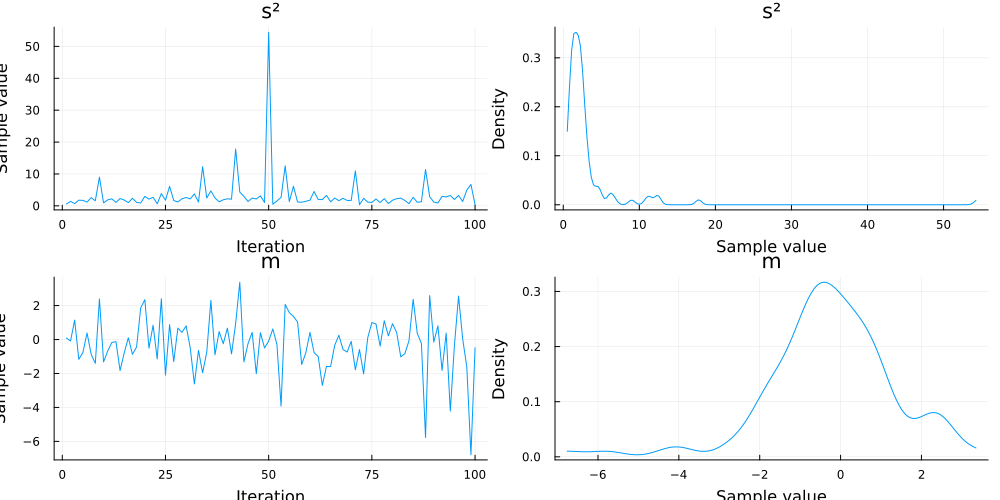

In [13]:
Plots.plot(chn)

In [14]:
include("LensBase.jl")
include("LensUtils.jl")
include("LensFits.jl")
include("LensModels/NIE.jl")
include("LightModels/GaussianLight.jl")
include("LensNoise.jl");

In [15]:
x = range(-3, 3, 100);
thetax, thetay = ndgrid(x, x);

## Lens model

In [16]:
LensKwargs = Dict(:b => 1.5, :s => 0.1, :q => 0.9, :varphi => pi / 3, :xcentre => 0.3, :ycentre => 0.0);
SourceKwargs = Dict(:amp => 3., :sigma => 0.2);

In [17]:
Lighttt = LensBase.LensRayShooting(thetax, thetay;
 LensModel=NIE, LensKwargs=LensKwargs, 
 SourceProfile=GaussianLight.GaussianSphere, SourceKwargs=SourceKwargs);

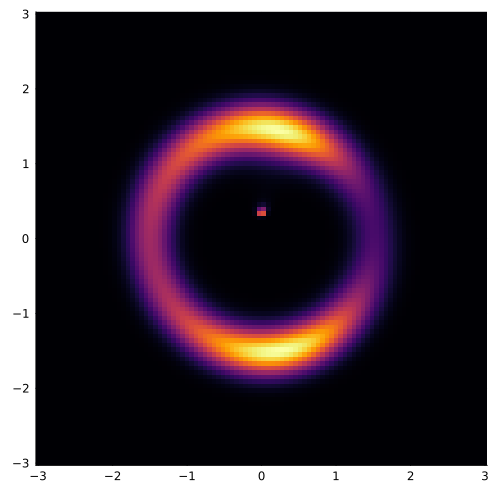

In [18]:
heatmap(x, x, Lighttt,size=(500,500), colorbar=false)

## PSF

In [19]:
using PSFModels, Plots, ImageFiltering
using PSFModels: fit
using HCIDatasets: BetaPictoris

In [20]:
PSFmodel = gaussian(x=0, y=0, fwhm=5);
inds = CartesianIndices((-40:40, -40:40));
psf = PSFmodel.(inds) ./ sum(PSFmodel.(inds));
conved = imfilter(Lighttt, PSFmodel.(inds));

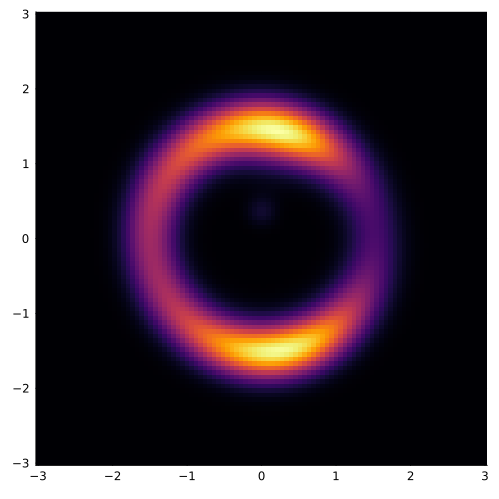

In [21]:
heatmap(x, x, conved,size=(500,500), colorbar=false)

## Noise

In [22]:
pn = LensNoise.PoissonNoise(conved, 200.);
bn = LensNoise.GaussianNoise(conved, 10.);

# obs

In [23]:
obs = conved .+ pn .+ bn;

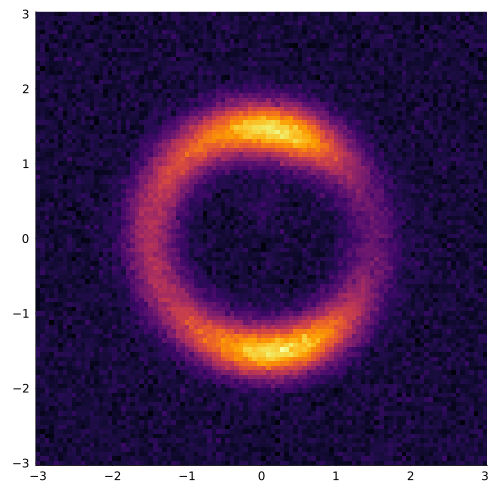

In [24]:
heatmap(x, x, obs,size=(500,500), colorbar=false)

In [27]:
@model function LensMCMC(obs)

    # Lens parameter
    b ~ Uniform(1.,2.)
    s ~ Uniform(0.01, 0.2)
    q ~ Uniform(0.5,1.5)
    varphi ~ Uniform(0, pi)
    xcentrel ~ Uniform(-0.5, 0.5)
    ycentrel ~ Uniform(-0.5, 0.5)
    # Source parameter
    amp ~ Uniform(0.1, 5.0)
    sigma ~ Uniform(0.1, 0.3)
    xcentres ~ Uniform(-0.5, 0.5)
    ycentres ~ Uniform(-0.5, 0.5)

    # simulation
    LensKwargs = Dict(:b => b, :s => s, :q => q, :varphi => varphi,
                        :xcentre => xcentrel, :ycentre => ycentrel);
    SourceKwargs = Dict(:amp => amp, :sigma => sigma,
                        :xcentre => xcentres, :ycentre => ycentres);
    light = LensBase.LensRayShooting(thetax, thetay;
            LensModel=NIE, LensKwargs=LensKwargs, 
                SourceProfile=GaussianLight.GaussianSphere,
                    SourceKwargs=SourceKwargs);
    conved = imfilter(light, PSFmodel.(inds));
    pn = LensNoise.PoissonNoise(conved, 200.);
    bn = LensNoise.GaussianNoise(conved, 10.);
    sim = conved .+ pn .+ bn;

    for i in eachindex(obs)
        obs[i] ~ Normal(sim[i], 1)
    end

end

LensMCMC (generic function with 2 methods)

In [28]:
lenschn = sample(LensMCMC(obs), NUTS(), 5_00)

Sampling   0%|                                          |  ETA: N/A
Sampling 100%|██████████████████████████████████████████| Time: 0:00:01


TypeError: TypeError: in keyword argument b, expected Float64, got a value of type ForwardDiff.Dual{ForwardDiff.Tag{Turing.TuringTag, Float64}, Float64, 10}

# Benchmark Test

In [1]:
using BenchmarkTools

In [427]:
l = range(0, 100, 10000)

0.0:0.010001000100010001:100.0

In [431]:
function loopfunc(l)

    newl = []
    for i in l
        push!(newl, 2 .* i)
    end

    return newl
end

loopfunc (generic function with 1 method)

In [429]:
function vecfunc(l)

    return [2 .* i for i in l]

end

vecfunc (generic function with 1 method)

In [435]:
@btime loopfunc(l); # Low power model

  93.625 μs (10009 allocations: 483.03 KiB)


In [436]:
@btime vecfunc(l); # Low power model

  15.375 μs (2 allocations: 78.17 KiB)


In [46]:
# Define matrix A and vector B
A = rand(100, 100)  # Larger matrix for more noticeable differences
B = rand(100)       # Corresponding vector

# single
function func(A::Matrix, B::Float64)

    return A .* B

end

function Func(A)

    function func(B)

        return A .* B
    end

    return func

end

# For-Loop
function LoopFunc(A, B)

    newl = []
    for i in 1:length(B)
        push!(newl, A .* B[i])
    end

    return newl
end

# Method 1: Array Comprehension
function ArrayFunc(A, B)

    return [A .* b for b in B]

end

# Method 2: Explicit Broadcasting
MatrixFunc(A, B) = begin
    B_reshaped = reshape(B, 1, 1, :)
    A .* B_reshaped
end


MatrixFunc (generic function with 2 methods)

In [34]:
# Benchmarking
benchmark0 = @time LoopFunc(A, B);
benchmark1 = @time ArrayFunc(A, B);
benchmark2 = @time MatrixFunc(A, B);

println("Method 0 (Array Comprehension):")
println(benchmark0)

println("Method 1 (Array Comprehension):")
println(benchmark1)

println("Method 2 (Explicit Broadcasting):")
println(benchmark2)

In [40]:
ff = Func(A)

(::var"#func#32"{Matrix{Float64}}) (generic function with 1 method)

In [49]:
ff.(B)[1]

100×100 Matrix{Float64}:
 0.44495    0.465525   0.24655   …  0.300899   0.429692   0.0477869
 0.494527   0.623689   0.666888     0.479507   0.402468   0.0544241
 0.684257   0.379185   0.38229      0.286572   0.0158357  0.118911
 0.783564   0.0123723  0.808474     0.0517261  0.356401   0.369694
 0.406277   0.696767   0.604328     0.371307   0.473121   0.230586
 0.49873    0.746801   0.516226  …  0.779539   0.564427   0.432398
 0.501474   0.0522179  0.291949     0.104844   0.632853   0.182364
 0.761251   0.661339   0.834388     0.816574   0.232215   0.205254
 0.359959   0.541671   0.656525     0.0729606  0.216204   0.819816
 0.780266   0.288882   0.043468     0.0772494  0.329673   0.778977
 ⋮                               ⋱                        
 0.0137589  0.781701   0.42677      0.29509    0.0738962  0.546155
 0.320924   0.454185   0.56666      0.71149    0.820508   0.317747
 0.612042   0.0451933  0.125772     0.345115   0.129309   0.332988
 0.374419   0.702599   0.139087     0.04685

In [47]:
func.(A, B)

100×100 Matrix{Float64}:
 0.0714363   0.012725    0.403424    …  0.443773    0.569607    0.095772
 0.00802714  0.0315995   0.00631123     0.0332152   0.0366836   0.0201381
 0.0796603   0.0186559   0.0593441      0.00612068  0.0321684   0.0438257
 0.0312038   0.0301237   0.00370505     0.17252     0.134069    0.160834
 0.0432728   0.147466    0.0233007      0.047427    0.0355143   0.0756096
 0.196882    0.303483    0.312061    …  0.537856    0.375149    0.548503
 0.472319    0.0320503   0.493443       0.0645396   0.188404    0.156685
 0.00199431  0.0146644   0.00565753     0.0225484   0.0179815   0.000930043
 0.00624949  0.0112341   0.0115864      0.00742717  0.00405167  0.0181325
 0.374517    0.0958438   0.282293       0.057792    0.255194    0.395363
 ⋮                                   ⋱                          
 0.0905324   0.188541    0.143737       0.0380407   0.056849    0.341103
 0.0750207   0.359516    0.0787183      0.0747801   0.31513     0.331432
 0.0534101   0.00301874  0.

In [478]:
using DeconvOptim, TestImages, Colors, ImageIO, Noise, ImageShow, Statistics, NDTools

ArgumentError: ArgumentError: Package NDTools not found in current path.
- Run `import Pkg; Pkg.add("NDTools")` to install the NDTools package.

# Deconv

In [477]:
img = Float32.(testimage("resolution_test_512"));
imgn = poisson(img, 300);
psf = Float32.(generate_psf(size(img), 5));
img_c = conv(img, psf);
img_p = poisson(img_c, 100);
img_g = add_gauss(img_p, 0.1);
res, o = deconvolution(img_g, psf, loss=Poisson(), λ=1e-10);

In [443]:
size(psf)

(512, 512)

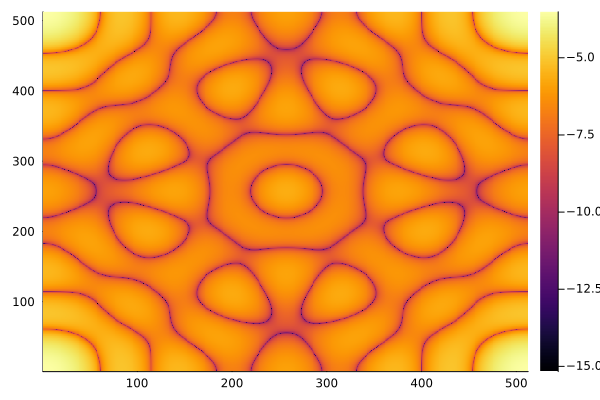

In [444]:
heatmap(log10.(psf))

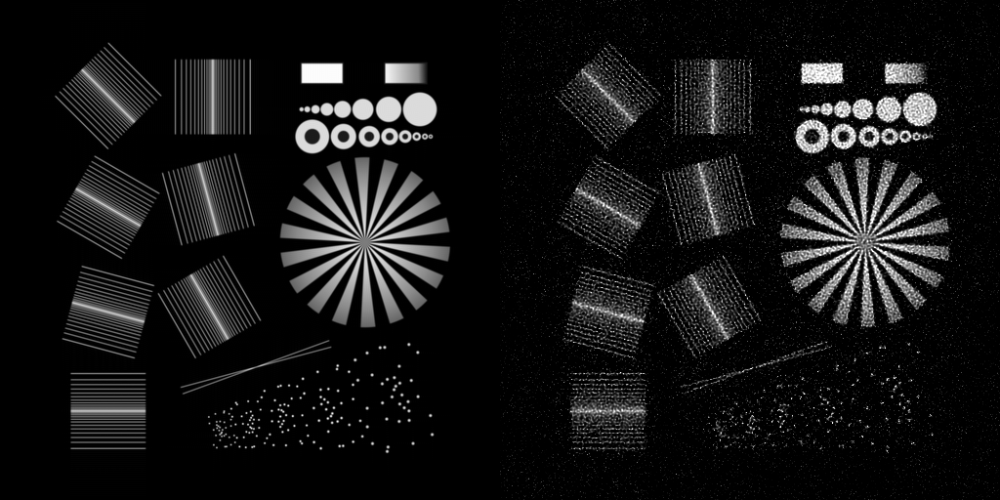

In [180]:
Gray.([img  res])

In [176]:
log10(sum((imgn .- res).^2))

2.152915f0

In [178]:
var((img .- res).^2)

2.1240935f-6

In [40]:
var((poisson(img, 300) .- res).^2)

0.00061774533f0

In [409]:
img = ones(512,512);
imgn = poisson(img, 300);
psf = Float32.(generate_psf(size(img), 121));
img_c = conv(img, psf);
img_n = poisson(img_c, 300);
noise = poisson(img_n, 300) .- img_n
res, o = deconvolution(img_n, psf, λ=1e-10);

In [112]:
[ var(res), var(imgn) ]

2-element Vector{Float64}:
 0.09701153824529271
 0.0033275914547219705

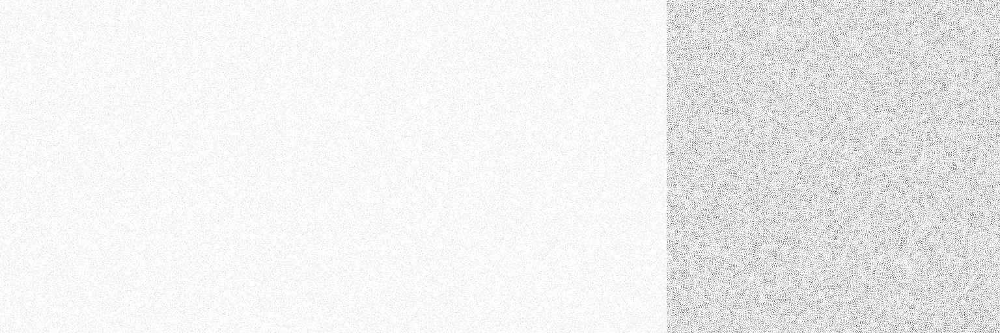

In [107]:
Gray.([imgn img_n res])

In [77]:
var((img .- res).^2)

0.11443003032404282

In [58]:
var((poisson(img, 300) .- res).^2)

0.03134716965146613

In [59]:
mean((img .- img_n).^2)

0.01103881704247045

In [125]:
img = ones(100,100);
psf = Float32.(generate_psf(size(img), 121));
img_n = conv(img, psf);
#img_n = poisson(img_n, 300);
res, o = deconvolution(img_n, psf, λ=1e-10);

In [127]:
[ var(res)
var(img) ]

2-element Vector{Float64}:
 0.0
 0.0

In [128]:
Gray.([imgn img_n res])

DimensionMismatch: DimensionMismatch: number of rows of each array must match (got (512, 100, 100))

In [115]:
var((img .- res).^2)

0.028228542019682237

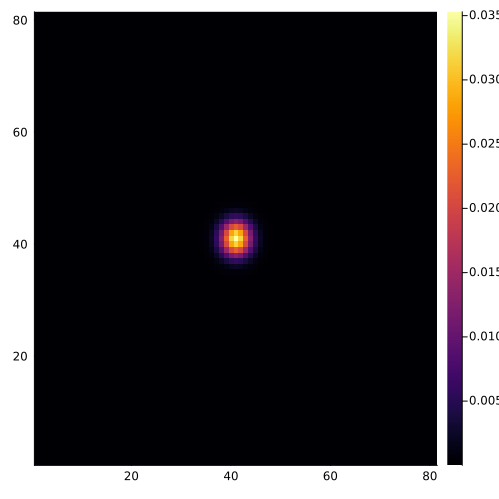

In [557]:
heatmap(psf,size=(500,500))

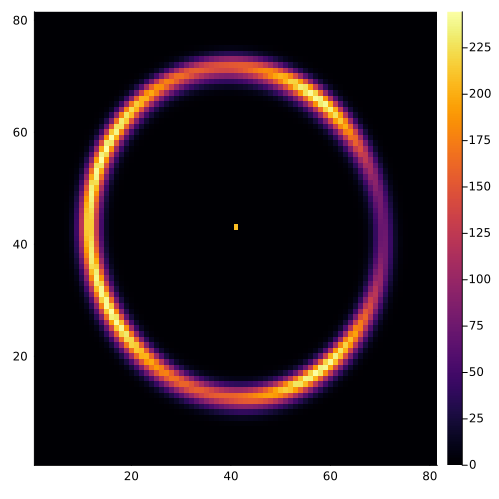

In [561]:
heatmap(Lighttt,size=(500,500))

In [582]:
conved = conv( Lighttt, psf ); #conved = imfilter(Lighttt, psf);

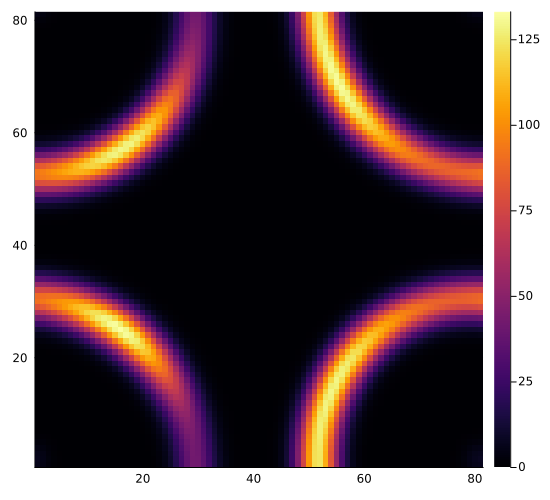

In [583]:
heatmap(conved,size=(550,500))

In [569]:
res, o = deconvolution(conved, psf, λ=0.05);

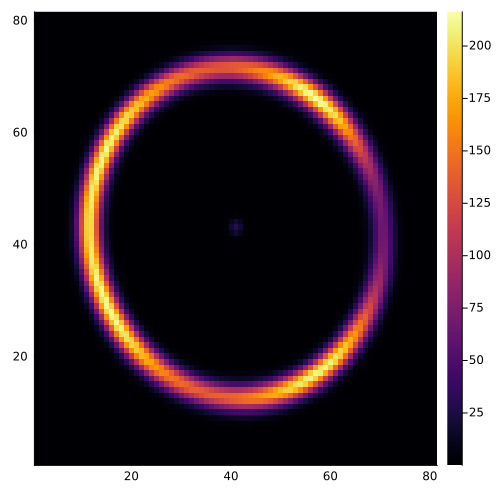

In [570]:
heatmap(res,size=(500,500))

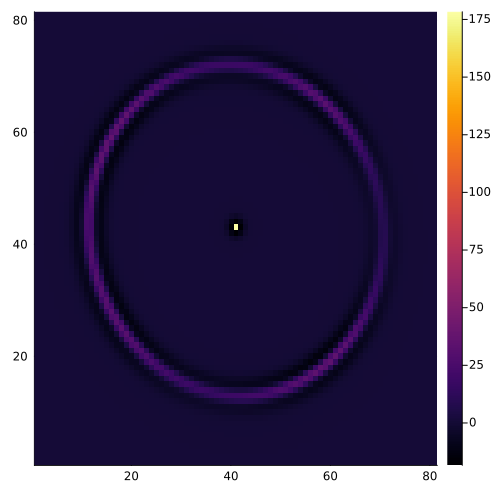

In [571]:
heatmap(Lighttt .- res,size=(500,500))

In [560]:
log10.(sum(res .- Lighttt).^2)

6.151223070583216

In [ ]:
using Turing
using Distributions
using Plots
using StatsPlots
using PairPlots
using CairoMakie

# Approximate calculation of b_n
b_n(n) = 2n - 0.324

# 2D Sérsic function
function sersic2d(x, y; I_e, r_e, n, x0, y0)
    r = sqrt.((x .- x0) .^ 2 .+ (y .- y0) .^ 2)
    return I_e .* exp.(-b_n(n) .* ((r ./ r_e) .^ (1 / n) .- 1))
end

# True parameters
I_e_true = 100.0
r_e_true = 5.0
n_true = 2.5
x0_true = 0.0
y0_true = 0.0

# Grid of observational points
x = range(-10, 10, length=100)
y = range(-10, 10, length=100)
X, Y = [repeat(x, 1, length(y));], [repeat(y', length(x), 1);]

# Simulate data with noise
σ_noise = 5.0
intensity_true = sersic2d(X, Y; I_e=I_e_true, r_e=r_e_true, n=n_true, x0=x0_true, y0=y0_true)
data_obs = intensity_true .+ rand(Normal(0, σ_noise), size(intensity_true))

# Plot simulated data
Plots.heatmap(x, y, data_obs, title="Simulated Data (Sérsic with Noise)", xlabel="x", ylabel="y")

# Define Turing model
@model function fit_sersic2d(x, y, data_obs)
    # Priors for parameters
    I_e ~ truncated(Normal(50, 50), 0, Inf)
    r_e ~ truncated(Normal(3, 5), 0, Inf)
    n ~ truncated(Normal(2, 2), 0.5, 10)
    x0 ~ Normal(0, 5)
    y0 ~ Normal(0, 5)
    σ_noise ~ truncated(Normal(0, 10), 0, Inf)

    # Sérsic model
    model_intensity = sersic2d(x, y; I_e, r_e, n, x0, y0)

    # Likelihood
    for i in eachindex(data_obs)
        data_obs[i] ~ Normal(model_intensity[i], σ_noise)
    end
end

# Perform sampling
chain = sample(fit_sersic2d(X, Y, data_obs), HMCDA(200, 0.65, 0.3), 1000) #NUTS(500,0.65)

# Pair plot
fig = PairPlots.pairplot(chain)